In [1]:
!pip install git-filter-repo

In [ ]:
!pip install wordcloud

In [1]:
from ALTA2024_part_1 import burrows_read_input_json
from ALTA2024_part_1 import make_json
from ALTA2024_part_1 import pca_dataframes_make
import json
import os
from zipfile import ZipFile

# EDA

In [7]:
# !pip install wordcloud
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd
import string
import wordcloud
import numpy as np
# # !pip install textstat
# import textstat




# !pip install nltk
# import nltk
# from nltk.corpus import stopwords
 
# nltk.download('stopwords')


In [137]:
df_train , _ = burrows_read_input_json("dev-labels")

## SEGMENT LENGTH AND BOUNDARIES

In [176]:
# json_data = pd.read_json('../alta2024_public_data/train.json')

import pandas as pd
import json


def extract_article_wise_df(filepath="../alta2024_public_data/train.json"):
    # Read the JSON file with UTF-8 encoding
    with open(filepath, "r", encoding="utf-8") as f:
        json_data = json.load(f)

    # Flatten the data into a list of dictionaries
    flattened_data = []
    article_counter = {}  # To handle repeated article IDs

    for article in json_data:
        article_id = article["id"]
        domain = article.get("domain", "unknown")  # Extract domain
        # Increment the counter for this article_id to ensure uniqueness
        if article_id not in article_counter:
            article_counter[article_id] = 0
        else:
            article_counter[article_id] += 1
        
        base_id = f"{article_id}-{article_counter[article_id]}"
        
        for idx, (sentence, label) in enumerate(article["sent_and_label"]):
            unique_id = f"{base_id}-{idx}"
            flattened_data.append({
                "unique_id": unique_id,
                "sentence": sentence,
                "label": label,
                "domain": domain  # Add domain here
            })

    df = pd.DataFrame(flattened_data, columns=["unique_id", "sentence", "label", "domain"])
    return df


def create_boundary_df(df_train):
    df = df_train.copy()
    df['article_id'] = df['unique_id'].apply(lambda x: '-'.join(x.split('-')[:2]))
    df = df[['label', 'article_id']]
    new_df = df.groupby("article_id")["label"].agg(list).to_frame().reset_index()
    return new_df


def calculate_segment_length(segments):
    if not segments:
        return 0.0
    
    # Identify segments and their lengths
    segment_lengths = []
    current_type = segments[0]
    current_length = 1
    
    for i in range(1, len(segments)):
        if segments[i] == current_type:
            current_length += 1
        else:
            segment_lengths.append(current_length)
            current_type = segments[i]
            current_length = 1
    segment_lengths.append(current_length)  # Append the last segment
    
    # Calculate total length
    total_length = sum(segment_lengths)
    if total_length == 0:
        return 0.0
    
    # Calculate weighted average segment length
    avg_segment_length = sum((length / total_length) * length for length in segment_lengths)
    
    return avg_segment_length


In [177]:
df = extract_article_wise_df()
df

,unique_id,sentence,label,domain
0,4082-0-0,"Dear sir or mam, Have you or someone in your f...",human,academic
1,4082-0-1,Do you or that person think that it would make...,human,academic
2,4082-0-2,"Would removing every book, cd, movie or magazi...",human,academic
3,4082-0-3,Do you believe that its everyone's decision wh...,human,academic
4,4082-0-4,I believe that alot of people in our community...,human,academic
...,...,...,...,...
212789,2579-0-2,In the wake of the tragic events in Charlottes...,machine,news
212790,2579-0-3,Prime Minister May emphasized the importance o...,machine,news
212791,2579-0-4,The UK government reaffirmed its commitment to...,machine,news
212792,2579-0-5,May's remarks echo the sentiments expressed by...,machine,news


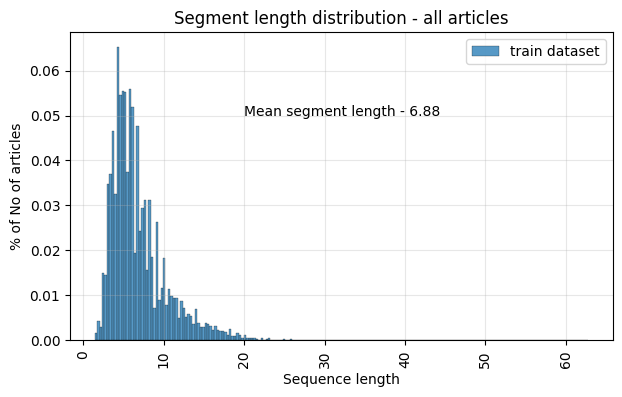

In [201]:
df = extract_article_wise_df()
new_df = create_boundary_df(df)

sequence_lengths = new_df['label'].apply(calculate_segment_length)

plt.figure(figsize=(7, 4))
sns.histplot(sequence_lengths, label='train dataset', stat='probability')
# sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability')
mean_seq_len = round(np.mean(sequence_lengths),2)
plt.legend()
plt.title('Segment length distribution - all articles')
plt.annotate(f'Mean segment length - {mean_seq_len}',(20,0.05))
plt.xlabel('Sequence length')
plt.ylabel('% of No of articles')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=90)
plt.show()

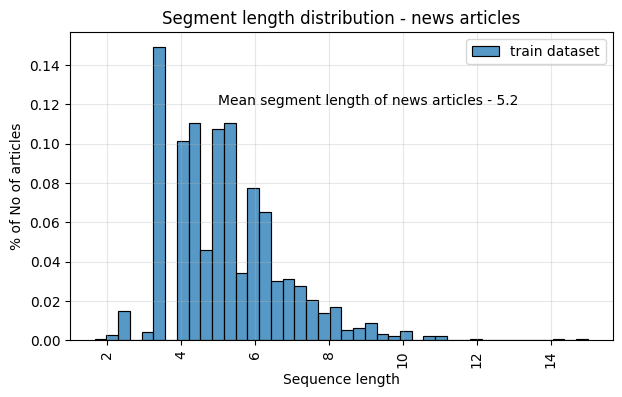

In [203]:
df = extract_article_wise_df()
news_df = df[df['domain']=='news']
new_df = create_boundary_df(news_df)

sequence_lengths = new_df['label'].apply(calculate_segment_length)

plt.figure(figsize=(7, 4))
sns.histplot(sequence_lengths, label='train dataset', stat='probability')
# sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability')
mean_seq_len = round(np.mean(sequence_lengths),2)
plt.legend()
plt.title('Segment length distribution - news articles')
plt.annotate(f'Mean segment length of news articles - {mean_seq_len}',(5,0.12))
plt.xlabel('Sequence length')
plt.ylabel('% of No of articles')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=90)
plt.show()

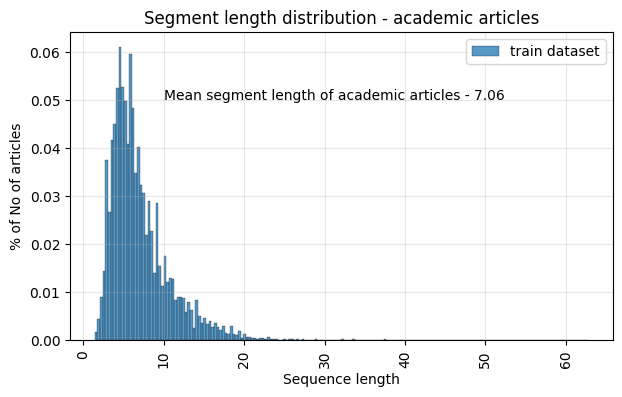

In [206]:
df = extract_article_wise_df()
news_df = df[df['domain']=='academic']
new_df = create_boundary_df(news_df)

sequence_lengths = new_df['label'].apply(calculate_segment_length)

plt.figure(figsize=(7, 4))
sns.histplot(sequence_lengths, label='train dataset', stat='probability')
# sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability')
mean_seq_len = round(np.mean(sequence_lengths),2)
plt.legend()
plt.title('Segment length distribution - academic articles')
plt.annotate(f'Mean segment length of academic articles - {mean_seq_len}',(15,0.05))
plt.xlabel('Sequence length')
plt.ylabel('% of No of articles')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=90)
plt.show()

## SENTENCE LENGTH

In [4]:
df_train , _ = burrows_read_input_json("dev-labels")

In [5]:
human_sentences = df_train.loc[df_train['label'] == 'human',['sent']]
machine_sentences = df_train.loc[df_train['label'] == 'machine',['sent']]

human_sentences['sent_len'] = human_sentences['sent'].apply(lambda x : len(x.split(' ')))
human_sentences.index = [num for num in range(0,human_sentences.shape[0])]

machine_sentences['sent_len'] = machine_sentences['sent'].apply(lambda x : len(x.split(' ')))
machine_sentences.index = [num for num in range(0,machine_sentences.shape[0])]


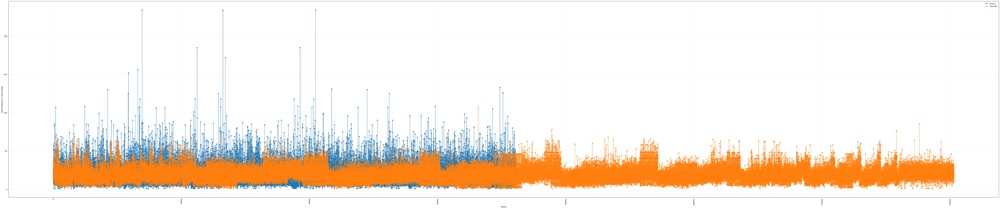

In [6]:
plt.figure(figsize=(100, 20))
plt.plot(human_sentences.index, human_sentences['sent_len'], label='human', marker='o', alpha=0.7)
plt.plot(machine_sentences.index, machine_sentences['sent_len'], label='machine', marker='o', alpha=0.7)
plt.legend()
plt.xlabel('Words')
plt.ylabel('Word frequency in percentage')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=90)
plt.show()

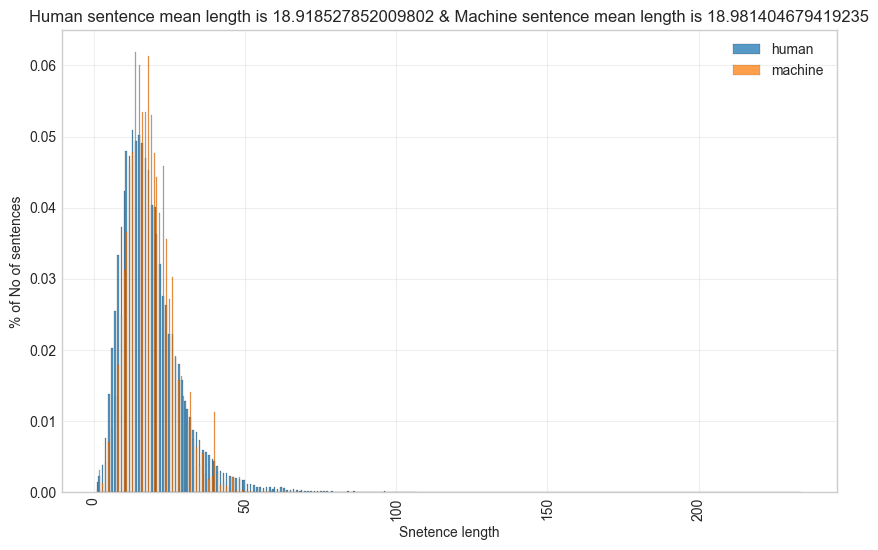

In [69]:
plt.figure(figsize=(10, 6))
sns.histplot(human_sentences['sent_len'], label='human', stat='probability')
sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability')
human_mean = float(np.mean(human_sentences['sent_len']))
machine_mean = float(np.mean(machine_sentences['sent_len']))
plt.legend()
plt.title(f'Human sentence mean length is {human_mean} & Machine sentence mean length is {machine_mean}')
plt.xlabel('Snetence length')
plt.ylabel('% of No of sentences')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=90)
plt.show()

In [8]:
# FINDING MEAN AND STDEV OF THE 2 LABELS' SENTENCE LENGTHS

human_mean = round(float(np.mean(human_sentences['sent_len'])),2)
machine_mean = round(float(np.mean(machine_sentences['sent_len'])),2)

human_sd = round(float(np.std(human_sentences['sent_len'])),2)
machine_sd = round(float(np.std(machine_sentences['sent_len'])),2)

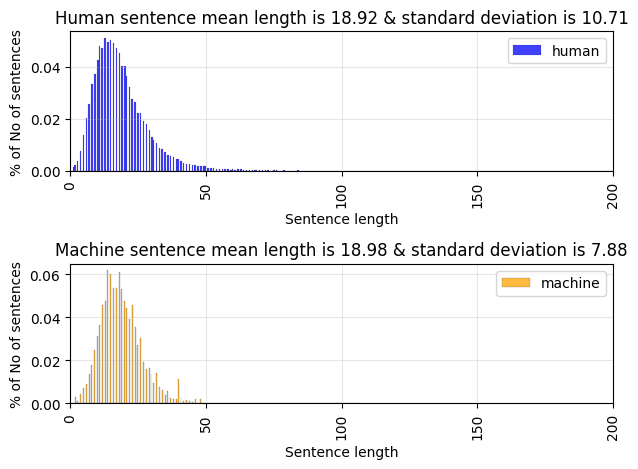

In [10]:
fig, (ax1, ax2) = plt.subplots(2, 1)

# Human sentences histogram
sns.histplot(human_sentences['sent_len'], label='human', stat='probability', ax=ax1, color='blue')
ax1.legend()
ax1.set_title(f'Human sentence mean length is {human_mean} & standard deviation is {human_sd}')
ax1.set_xlabel('Sentence length')
ax1.set_ylabel('% of No of sentences')
ax1.grid(True, alpha=0.3)
ax1.set_xticks(np.arange(0, 201, 50))  # Set x-ticks to 0, 50, 100, 150, 200
ax1.tick_params(axis='x', rotation=90)
ax1.set_xlim(0, 200)

# Machine sentences histogram
sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability', ax=ax2, color='orange')
ax2.legend()
ax2.set_title(f'Machine sentence mean length is {machine_mean} & standard deviation is {machine_sd}')
ax2.set_xlabel('Sentence length')
ax2.set_ylabel('% of No of sentences')
ax2.grid(True, alpha=0.3)
ax2.set_xticks(np.arange(0, 201, 50))  # Set x-ticks to 0, 50, 100, 150, 200
ax2.tick_params(axis='x', rotation=90)
ax2.set_xlim(0, 200)

plt.tight_layout()

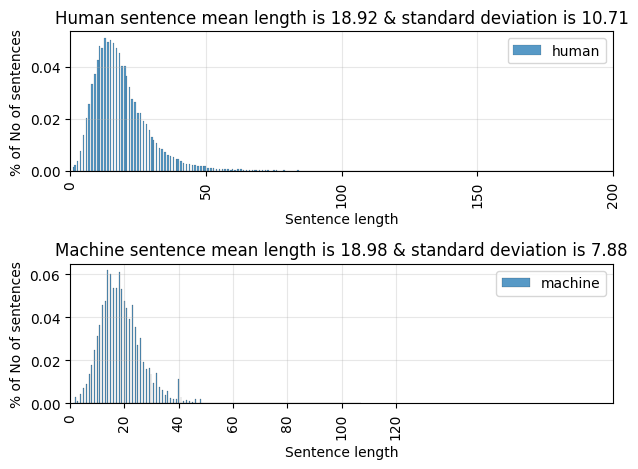

In [ ]:
#

fig, (ax1, ax2) = plt.subplots(2,1)

sns.histplot(human_sentences['sent_len'], label='human', stat='probability', ax=ax1)
ax1.legend()
ax1.set_title(f'Human sentence mean length is {human_mean} & standard deviation is {human_sd}')
ax1.set_xlabel('Sentence length')
ax1.set_ylabel('% of No of sentences')
ax1.grid(True, alpha=0.3)
ax1.set_xticks(ax1.get_xticks())  # Ensure ticks exist before rotating
ax1.tick_params(axis='x', rotation=90)
ax1.set_xlim(0,200)

sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability', ax=ax2)
ax2.legend()
ax2.set_title(f'Machine sentence mean length is {machine_mean} & standard deviation is {machine_sd}')
ax2.set_xlabel('Sentence length')
ax2.set_ylabel('% of No of sentences')
ax2.grid(True, alpha=0.3)
ax2.set_xticks(ax2.get_xticks())  # Ensure ticks exist before rotating
ax2.tick_params(axis='x', rotation=90)
ax2.set_xlim(0,200)

plt.tight_layout()
plt.show()




## VOCABULARY COMPARE ACROSS LABELS

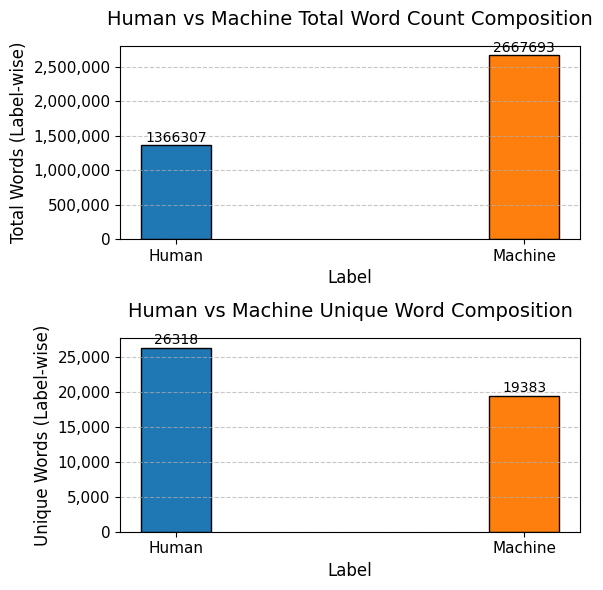

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.ticker as ticker

# Raw data
human_total = sum(human_vocab.values())
machine_total = sum(machine_vocab.values())
human_unique = len(human_vocab)
machine_unique = len(machine_vocab)

human_color = '#1f77b4'  # Blue for human
machine_color = '#ff7f0e'  # Saffron for machine


fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 6))  # 2 rows, 1 column

# Define bar width and colors
bar_width = 0.2
colors = ['#1f77b4', '#ff7f0e']  # Blue for Human, Orange for Machine

# First subplot: Total Words
bars1 = ax1.bar(['Human', 'Machine'], [human_total, machine_total], width=bar_width, 
                color=colors, label='Total Words', edgecolor='black')
ax1.set_title('Human vs Machine Total Word Count Composition', fontsize=14, pad=15)
ax1.set_xlabel('Label', fontsize=12)
ax1.set_ylabel('Total Words (Label-wise)', fontsize=12)
ax1.set_xticks(['Human', 'Machine'])
ax1.tick_params(axis='x', rotation=0, labelsize=11)
ax1.tick_params(axis='y', labelsize=11)

ax1.grid(True, axis='y', linestyle='--', alpha=0.7)  # Add horizontal grid lines

# Annotate bars with values
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height + 300, f'{int(height)}', 
             ha='center', va='bottom', fontsize=10, color='black')
ax1.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Second subplot: Unique Words
bars2 = ax2.bar(['Human', 'Machine'], [human_unique, machine_unique], width=bar_width, 
                color=colors, label='Unique Words', edgecolor='black')
ax2.set_title('Human vs Machine Unique Word Composition', fontsize=14, pad=15)
ax2.set_xlabel('Label', fontsize=12)
ax2.set_ylabel('Unique Words (Label-wise)', fontsize=12)
ax2.set_xticks(['Human', 'Machine'])
ax2.tick_params(axis='x', rotation=0, labelsize=11)
ax2.tick_params(axis='y', labelsize=11)

ax2.grid(True, axis='y', linestyle='--', alpha=0.7)  # Add horizontal grid lines

# Annotate bars with values
for bar in bars2:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width() / 2, height + 100, f'{int(height)}', 
             ha='center', va='bottom', fontsize=10, color='black')

ax2.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Adjust layout and save
plt.tight_layout()

# Calculate totals for normalization


# Convert to percentages


# Create subplots
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))  # 2 rows, 1 column

# # Define bar width
# bar_width = 0.5  # Reasonable width for single bars per category

# # First subplot: Total Words
# ax1.bar(['Human', 'Machine'], [human_total, machine_total], width=bar_width, label='Total Words')
# ax1.set_title('Human vs Machine Total Word Count Composition')
# ax1.set_xlabel('Label')
# ax1.set_ylabel('Total words label-wise')
# ax1.set_xticks(['Human', 'Machine'])
# ax1.tick_params(axis='x', rotation=0)  # No rotation needed with two labels
# ax1.legend()

# # Second subplot: Unique Words
# ax2.bar(['Human', 'Machine'], [human_unique, machine_unique], width=bar_width, label='Unique Words')
# ax2.set_title('Human vs Machine Unique Word Composition')
# ax2.set_xlabel('Label')
# ax2.set_ylabel('Unique words label-wise')
# ax2.set_xticks(['Human', 'Machine'])
# ax2.tick_params(axis='x', rotation=0)
# ax2.legend()

# # Adjust layout and display
# plt.tight_layout()
# plt.show()

In [3]:
df_train , _ = burrows_read_input_json("dev-labels")

In [16]:
len(machine_vocab)

19383

In [13]:
sum(human_vocab.values())

1366307

In [14]:
sum(machine_vocab.values())

2667693

In [12]:
df_human = df_train.loc[df_train['label'] == 'human',]
text_human = df_human['sent']
df_machine = df_train.loc[df_train['label'] == 'machine',]
text_machine = df_machine['sent']

human_vocab = Counter()
for text in text_human:
    human_vocab.update([word.strip(string.punctuation) for word in text.lower().split()])

machine_vocab = Counter()
for text in text_machine:
    machine_vocab.update([word.strip(string.punctuation) for word in text.lower().split()])

df_human_word_counter = pd.DataFrame.from_dict(data=human_vocab, orient='index', columns=['Count'])
df_machine_word_counter = pd.DataFrame.from_dict(data=machine_vocab, orient='index', columns=['Count'])


df_human_word_counter['Count_percent'] = df_human_word_counter['Count']*100/sum(human_vocab.values())
df_machine_word_counter['Count_percent'] = df_machine_word_counter['Count']*100/sum(machine_vocab.values())

In [7]:
df_human_word_counter.sort_values(by='Count_percent',ascending=False).iloc[:50]

,Count,Count_percent
the,94973,6.951073
to,47576,3.482087
and,34640,2.535301
of,29439,2.154640
a,27756,2.031461
that,24913,1.823382
in,22846,1.672099
is,18975,1.388780
it,18472,1.351966
was,15720,1.150547


In [9]:
df_machine_word_counter.sort_values(by='Count_percent',ascending=False).iloc[:50]
# df_human_word_counter.sort_values(by='Count_percent',ascending=False).iloc[:50]




,Count,Count_percent
the,195694,7.335702
to,101310,3.797663
and,101102,3.789866
of,66057,2.476184
a,55625,2.085135
in,47912,1.796009
that,39179,1.468647
is,29855,1.119132
for,26141,0.979910
it,24997,0.937027


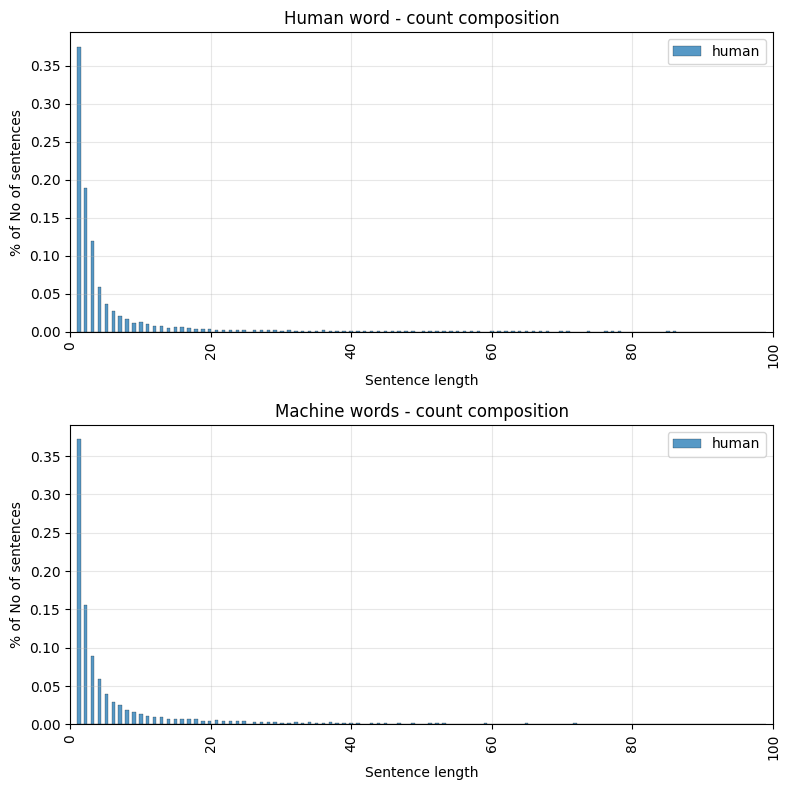

In [76]:
fig, (ax1, ax2) = plt.subplots(2,1)

sns.histplot(data = df_human_word_counter.loc[df_human_word_counter['Count']<100,:], x = 'Count', label='human', stat='probability', bins=200, ax = ax1)
ax1.legend()
ax1.set_title(f'Human word - count composition')
ax1.set_xlabel('Sentence length')
ax1.set_ylabel('% of No of sentences')
ax1.grid(True, alpha=0.3)
ax1.set_xticks(ax1.get_xticks())  # Ensure ticks exist before rotating
ax1.tick_params(axis='x', rotation=90)
ax1.set_xlim(0,100)

sns.histplot(data = df_machine_word_counter.loc[df_machine_word_counter['Count']<100,:], x = 'Count', label='human', stat='probability', bins=200, ax = ax2)
ax2.legend()
ax2.set_title(f'Machine words - count composition')
ax2.set_xlabel('Sentence length')
ax2.set_ylabel('% of No of sentences')
ax2.grid(True, alpha=0.3)
ax2.set_xticks(ax2.get_xticks())  # Ensure ticks exist before rotating
ax2.tick_params(axis='x', rotation=90)
ax2.set_xlim(0,100)

fig.set_size_inches(8, 8)

plt.tight_layout()
plt.show()

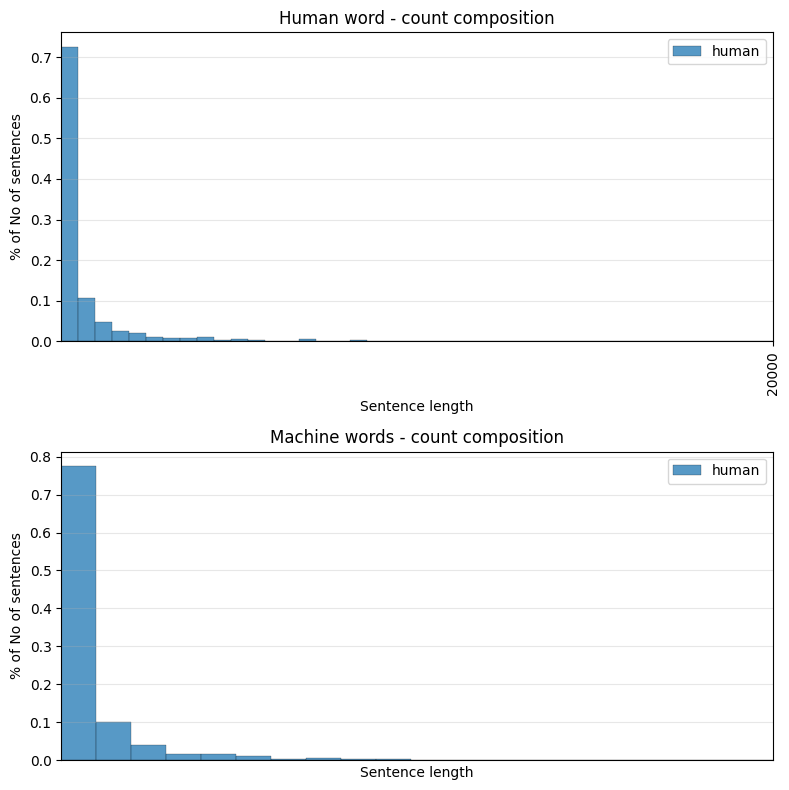

In [89]:

fig2, (ax3, ax4) = plt.subplots(2,1)

sns.histplot(data = df_human_word_counter.loc[df_human_word_counter['Count']>100,:], x = 'Count', label='human', stat='probability', bins=200, ax = ax3)
ax3.legend()
ax3.set_title(f'Human word - count composition')
ax3.set_xlabel('Sentence length')
ax3.set_ylabel('% of No of sentences')
ax3.grid(True, alpha=0.3)
ax3.set_xticks(ax3.get_xticks())  # Ensure ticks exist before rotating
ax3.tick_params(axis='x', rotation=90)
ax3.set_xlim(100,20000)

sns.histplot(data = df_machine_word_counter.loc[df_machine_word_counter['Count']>100,:], x = 'Count', label='human', stat='probability', bins=200, ax = ax4)
ax4.legend()
ax4.set_title(f'Machine words - count composition')
ax4.set_xlabel('Sentence length')
ax4.set_ylabel('% of No of sentences')
ax4.grid(True, alpha=0.3)
ax4.set_xticks(ax4.get_xticks())  # Ensure ticks exist before rotating
ax4.tick_params(axis='x', rotation=90)
ax4.set_xlim(100,20000)

fig2.set_size_inches(8, 8)

plt.tight_layout()
plt.show()

In [ ]:
fig, (ax1, ax2) = plt.subplots(2,1)

sns.histplot(human_sentences['sent_len'], label='human', stat='probability', ax=ax1)
ax1.legend()
ax1.set_title(f'Human sentence mean length is {human_mean} & standard deviation is {human_sd}')
ax1.set_xlabel('Sentence length')
ax1.set_ylabel('% of No of sentences')
ax1.grid(True, alpha=0.3)
ax1.set_xticks(ax1.get_xticks())  # Ensure ticks exist before rotating
ax1.tick_params(axis='x', rotation=90)
ax1.set_xlim(0,200)

sns.histplot(machine_sentences['sent_len'], label='machine', stat='probability', ax=ax2)
ax2.legend()
ax2.set_title(f'Machine sentence mean length is {machine_mean} & standard deviation is {machine_sd}')
ax2.set_xlabel('Sentence length')
ax2.set_ylabel('% of No of sentences')
ax2.grid(True, alpha=0.3)
ax2.set_xticks(ax2.get_xticks())  # Ensure ticks exist before rotating
ax2.tick_params(axis='x', rotation=90)
ax2.set_xlim(0,200)

plt.tight_layout()
plt.show()

## LONG SENTENCE OUTLIERS

In [96]:
machine_sentences.sort_values(by=['sent_len'], ascending=False).iloc[1:50,:]

,sent,sent_len
135201,"Last year, she stole the show at her mom Goldi...",85
77807,Although two dirigibles did attempt to reach t...,78
131622,Irving Clavan of the building’s architectural ...,76
61510,"At that point, I didn't understand what she wa...",73
26223,"It will show people how the world is, and if t...",70
77835,"In conclusion, despite the architects' efforts...",70
63695,"It will show people how the world is, and if t...",70
21506,The town looking like a ghost town would bring...,68
86618,The town looking like a ghost town would bring...,68
93214,"In the end, the idea of using the mooring mast...",66


In [24]:
human_sentences.sort_values(by=['sent_len'], ascending=False).iloc[1:50,:]

,sent,sent_len
26466,They are also making books that have alot of f...,234
40923,They are also making books that have alot of f...,234
22436,i am very tickleish when someone tickle me i s...,185
38519,i am very tickleish when someone tickle me i s...,185
26875,Well first off i really dont think that any of...,172
13174,many people like riading to bookes much peopel...,156
11720,People put up money and countless amounts of t...,152
69703,Here’s a list of the high water locations bein...,133
43448,The two major ones in this story were moving t...,131
8485,The feature of the setting affect the cyclist ...,130


## DOMAIN PROPORTION

C:\Users\joelj\AppData\Local\Temp\ipykernel_15828\130314431.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_train, x='label', stat='percent', palette=colors,


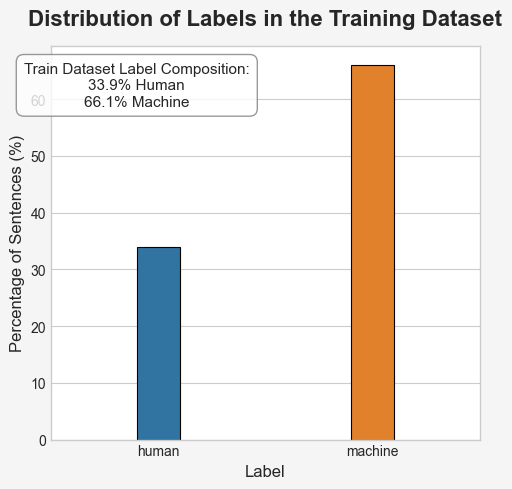

In [26]:
acad = round((df_train.loc[ df_train['label'] == 'human' ].shape[0]/df_train.shape[0]) *100,2)
news = round((df_train.loc[ df_train['label'] == 'machine' ].shape[0]/df_train.shape[0]) *100,2)

# plt.figure(num=1, figsize=(7,7))
# sns.countplot(data=df_train, x=df_train.label, stat ='percent')
# plt.title("Distribution of labels in the train dataset")
# plt.annotate(text=f'The train dataset consists of \n {acad}% human and \n {news}% machine(AI) sentences', xy = [50,300], xycoords='axes points')
# plt.ylabel('Percentage of sentences')
# plt.show()

import matplotlib.pyplot as plt
import seaborn as sns

# Set a modern style
plt.style.use('seaborn-v0_8-whitegrid')  # Clean grid look
plt.figure(num=1, figsize=(5, 5), facecolor='#f5f5f5')  # Light gray background

# Custom color palette for human vs. AI (muted tones)
colors = ['#1f77b4', '#ff7f0e']  # Blue for human, orange for AI

# Countplot with enhancements
ax = sns.countplot(data=df_train, x='label', stat='percent', palette=colors, 
                   edgecolor='black', linewidth=0.8, width=0.2)

# Title and labels with better typography
plt.title("Distribution of Labels in the Training Dataset", fontsize=16, fontweight='bold', 
         pad=15, fontfamily='Arial')
plt.xlabel("Label", fontsize=12, fontfamily='Arial')
plt.ylabel("Percentage of Sentences (%)", fontsize=12, fontfamily='Arial')

# Customize tick fonts
plt.xticks(fontsize=10, fontfamily='Arial')
plt.yticks(fontsize=10, fontfamily='Arial')

# Calculate percentages from the plot for annotation
total = len(df_train)
percentages = df_train['label'].value_counts(normalize=True) * 100
human_pct = percentages.get('human', 0).round(1)  # Assumes 'human' is a label
ai_pct = percentages.get('machine', 0).round(1)   # Assumes 'machine' is a label

# Add a centered annotation box
plt.text(0.2, 0.9, f"Train Dataset Label Composition:\n{human_pct}% Human\n{ai_pct}% Machine", 
         transform=ax.transAxes, ha='center', va='center', fontsize=11, fontfamily='Arial',
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.5'))

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()

In [82]:
df_train , _ = burrows_read_input_json("dev-labels")

C:\Users\joelj\AppData\Local\Temp\ipykernel_15828\3246387339.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_train, x='domain', stat='percent', palette=colors,


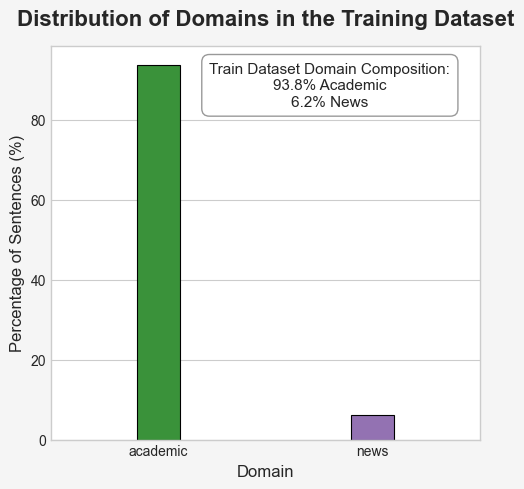

In [28]:
acad = round((df_train.loc[ df_train['domain'] == 'academic' ].shape[0]/df_train.shape[0]) *100,2)
news = round((df_train.loc[ df_train['domain'] == 'news' ].shape[0]/df_train.shape[0]) *100,2)

import matplotlib.pyplot as plt
import seaborn as sns

# Set a clean style
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(num=1, figsize=(5, 5), facecolor='#f5f5f5')  # Light gray background

# Custom colors for domains (green for academic, purple for news)
colors = ['#2ca02c', '#9467bd']  # Feel free to adjust these

# Countplot with enhancements
ax = sns.countplot(data=df_train, x='domain', stat='percent', palette=colors, 
                   edgecolor='black', linewidth=0.8, width=0.2)

# Title and labels with refined styling
plt.title("Distribution of Domains in the Training Dataset", fontsize=16, fontweight='bold', 
         pad=15, fontfamily='Arial')
plt.xlabel("Domain", fontsize=12, fontfamily='Arial')
plt.ylabel("Percentage of Sentences (%)", fontsize=12, fontfamily='Arial')

# Customize tick fonts
plt.xticks(fontsize=10, fontfamily='Arial')
plt.yticks(fontsize=10, fontfamily='Arial')

# Calculate percentages for annotation
total = len(df_train)
percentages = df_train['domain'].value_counts(normalize=True) * 100
academic_pct = percentages.get('academic', 0).round(1)  # Assumes 'academic' is a domain
news_pct = percentages.get('news', 0).round(1)         # Assumes 'news' is a domain

# Add a centered annotation box
plt.text(0.65, 0.9, f"Train Dataset Domain Composition:\n{academic_pct}% Academic\n{news_pct}% News", 
         transform=ax.transAxes, ha='center', va='center', fontsize=11, fontfamily='Arial',
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.5'))

# Adjust layout for a tight fit
plt.tight_layout()

# Show the plot
plt.show()

## TOP WORD'S PROPROTIONS AND HEATMAP  

In [77]:
df_train , _ = burrows_read_input_json("dev-labels")

In [39]:
# To generate a dataframe consisitng of a union of top_n words across both labels
# and to show their percentage counts

def generate_word_counts_df(df_train, top_n, remove_stopword):
    
    df_human = df_train.loc[df_train['label'] == 'human',]
    text_human = df_human['sent']
    df_machine = df_train.loc[df_train['label'] == 'machine',]
    text_machine = df_machine['sent']

    human_vocab = Counter()
    for text in text_human:
        human_vocab.update([word.strip(string.punctuation) for word in text.lower().split()])

    machine_vocab = Counter()
    for text in text_machine:
        machine_vocab.update([word.strip(string.punctuation) for word in text.lower().split()])

    if remove_stopword:

        for word in list(human_vocab):
            if word in stopwords.words('english'):
                del human_vocab[word]

        for word in list(machine_vocab):
            if word in stopwords.words('english'):
                del machine_vocab[word]

    machine_total = sum(machine_vocab.values())
    machine_vocab_norm = machine_vocab.copy()
    for key in machine_vocab_norm:
        machine_vocab_norm[key] = machine_vocab_norm[key]*100/machine_total

    human_total = sum(human_vocab.values())
    human_vocab_norm = human_vocab.copy()
    for key in human_vocab_norm:
        human_vocab_norm[key] = human_vocab_norm[key]*100/human_total

        
    df_human = pd.DataFrame.from_dict(human_vocab_norm, orient='index').reset_index()
    df_human.columns=['Word', 'Count']

    df_machine = pd.DataFrame.from_dict(machine_vocab_norm, orient='index').reset_index()
    df_machine.columns=['Word', 'Count']

    df_combined = df_machine.join(df_human.set_index('Word'), on='Word', how='outer', lsuffix='_machine', rsuffix='_human').sort_values('Count_machine',ascending=False)

    if top_n == None:
        return df_combined


    top_machine_words = [pair[0] for pair in machine_vocab_norm.most_common(top_n)]
    top_human_words = [pair[0] for pair in human_vocab_norm.most_common(top_n)]
    top_machine_words.extend(top_human_words)
    top_words = set(top_machine_words)

    final_df = df_combined[df_combined['Word'].isin(top_words)].reset_index().drop(['index'],axis=1)

    return final_df



In [22]:
# Plot top_n word count diff between AI and Human and return the dataframe showing differences

def generate_word_frequency_difference(df_train, top_n, remove_stopwords):
    df_combined  = generate_word_counts_df(df_train, None , remove_stopwords)
    df_combined['diff'] = abs(df_combined['Count_machine'] - df_combined['Count_human'])
    df_combined = df_combined.sort_values('diff', ascending = False)
    df_diff =df_combined.set_index('Word')
    df_diff = df_diff.head(top_n)
    # plt.figure(figsize=(10, 6))
    # plt.plot(df_diff.index, df_diff['Count_machine'], label='machine', marker='o', alpha=0.7)
    # plt.plot(df_diff.index, df_diff['Count_human'], label='human', marker='o', alpha=0.7)
    # plt.bar(df_diff.index, df_diff['diff'], label='Difference in word frequency %')
    # plt.legend()
    # if remove_stopwords:
    #     plt.title(f'Word frequency difference (top {top_n} and stopwords removed) Between AI and human text')
    # else:
    #     plt.title(f'Word frequency difference (top {top_n} ) Between AI and human text')
    # plt.xlabel('Words')
    # plt.ylabel('Word frequency in percentage')
    # plt.grid(True, alpha=0.3)
    # plt.xticks(rotation=90)
    # plt.show()
    # return df_diff

    # Set a clean style
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(10, 6), facecolor='#f5f5f5')  # Light gray background

    # Define colors
    human_color = '#1f77b4'  # Blue for human
    machine_color = '#ff7f0e'  # Saffron for machine
    diff_color = '#999999'  # Gray for difference

    # Plot lines for machine and human with markers
    plt.plot(df_diff.index, df_diff['Count_machine'], label='Machine', color=machine_color, 
            marker='o', linewidth=2, alpha=0.7)
    plt.plot(df_diff.index, df_diff['Count_human'], label='Human', color=human_color, 
            marker='o', linewidth=2, alpha=0.7)

    # Bar plot for difference
    plt.bar(df_diff.index, df_diff['diff'], label='Difference in Word Frequency (%)', 
            color=diff_color, alpha=0.5, edgecolor='black', linewidth=0.5)

    # Add a legend with styling
    plt.legend(fontsize=10, frameon=True, facecolor='white', edgecolor='gray', loc='best')

    # Dynamic title based on stopwords
    if remove_stopwords:
        plt.title(f'Word Frequency Difference (Top {top_n} Words, Stopwords Removed)\nBetween AI and Human Text', 
                fontsize=14, fontweight='bold', pad=15, fontfamily='Arial')
    else:
        plt.title(f'Word Frequency Difference (Top {top_n} Words, stopwords included)\nBetween AI and Human Text', 
                fontsize=14, fontweight='bold', pad=15, fontfamily='Arial')

    # Axis labels
    plt.xlabel('Words', fontsize=12, fontfamily='Arial')
    plt.ylabel('Word Frequency (%)', fontsize=12, fontfamily='Arial')

    # Customize grid and ticks
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.xticks(rotation=90, fontsize=10, fontfamily='Arial', ha='center')
    plt.yticks(fontsize=10, fontfamily='Arial')

    # Adjust layout to prevent clipping
    plt.tight_layout()

    # Show the plot
    plt.show()

    return df_diff  # Assuming this is part of a function


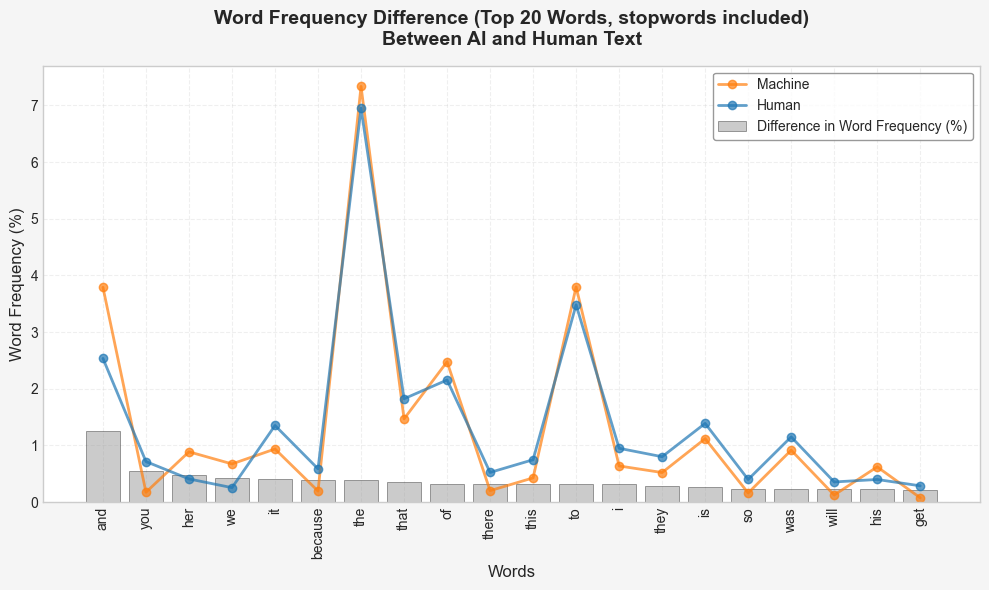

,Count_machine,Count_human,diff
Word,,,
and,3.789866,2.535301,1.254565
you,0.174046,0.714847,0.540801
her,0.887358,0.408327,0.479032
we,0.673391,0.254555,0.418836
it,0.937027,1.351966,0.414939
because,0.194700,0.587130,0.392430
the,7.335702,6.951073,0.384628
that,1.468647,1.823382,0.354735
of,2.476184,2.154640,0.321544


In [23]:
generate_word_frequency_difference(df_train, 20, False)

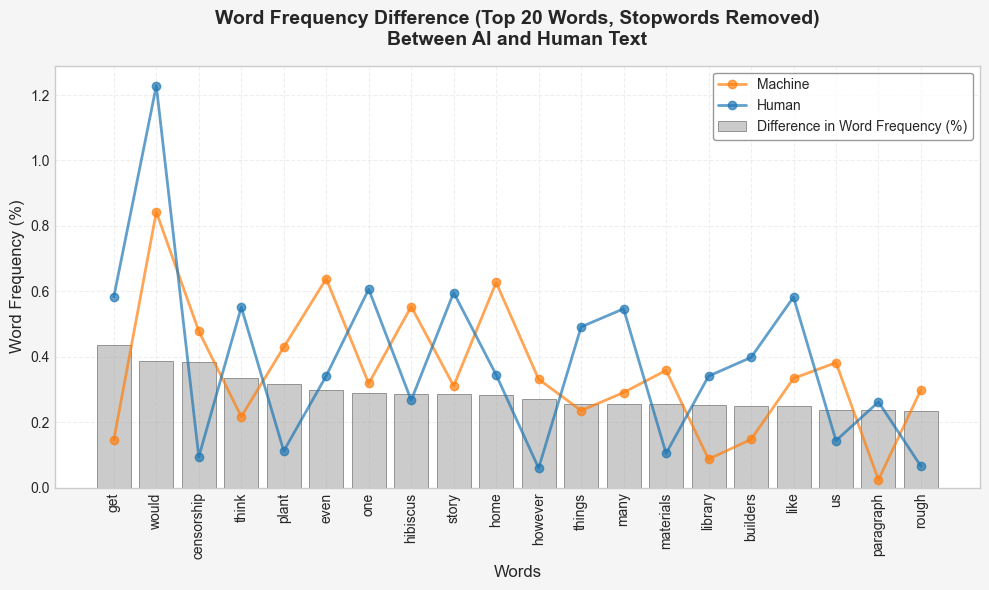

,Count_machine,Count_human,diff
Word,,,
get,0.146079,0.583438,0.437359
would,0.842668,1.228493,0.385825
censorship,0.478122,0.093767,0.384355
think,0.217164,0.551735,0.334572
plant,0.429116,0.111925,0.317191
even,0.638534,0.341579,0.296955
one,0.318217,0.606507,0.288290
hibiscus,0.553406,0.266863,0.286543
story,0.310906,0.596237,0.285331


In [24]:
generate_word_frequency_difference(df_train, 20, True)

## WORD CLOUDS

### HUMAN AND AI -- ALL DOMAINS

In [137]:
df_train , _ = burrows_read_input_json("dev-labels")

def generate_human_machine_vocab_counters(df_train, remove_stopword):

    df_human = df_train.loc[df_train['label'] == 'human',]
    text_human = df_human['sent']
    df_machine = df_train.loc[df_train['label'] == 'machine',]
    text_machine = df_machine['sent']

    human_vocab = Counter()
    for text in text_human:
        human_vocab.update([word.strip(string.punctuation) for word in text.lower().split()])

    machine_vocab = Counter()
    for text in text_machine:
        machine_vocab.update([word.strip(string.punctuation) for word in text.lower().split()])

    if remove_stopword:

        for word in list(human_vocab):
            if word in stopwords.words('english'):
                del human_vocab[word]

        for word in list(machine_vocab):
            if word in stopwords.words('english'):
                del machine_vocab[word]
    
    return human_vocab , machine_vocab

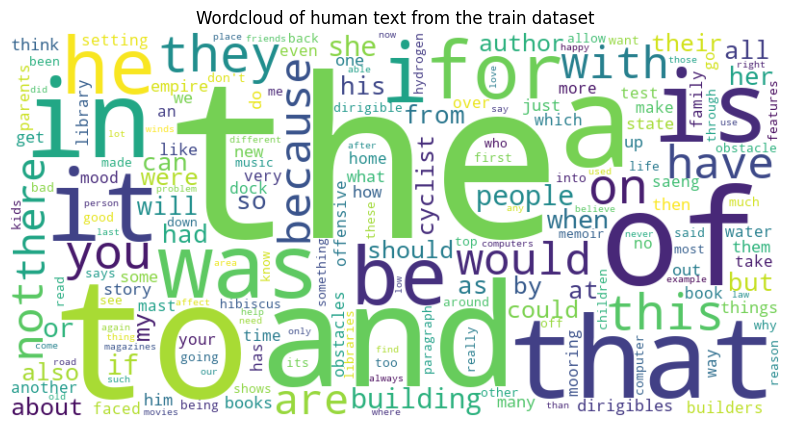

In [117]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Example counter object (replace with your own)


# Create the word cloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(human_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Wordcloud of human text from the train dataset')
plt.show()

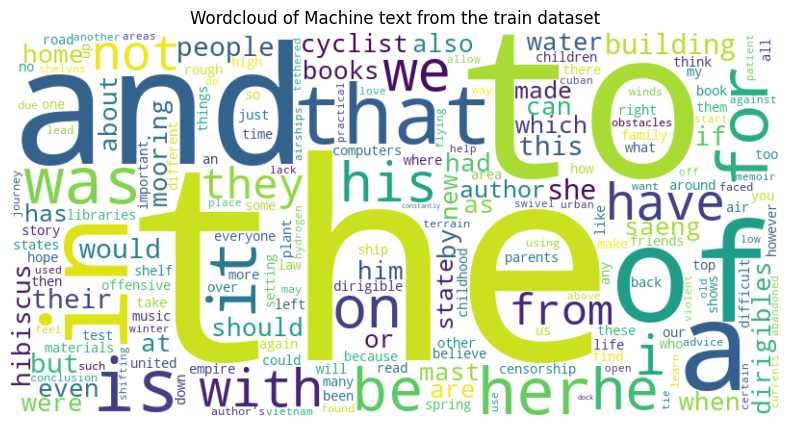

In [118]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(machine_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Wordcloud of Machine text from the train dataset')
plt.show()

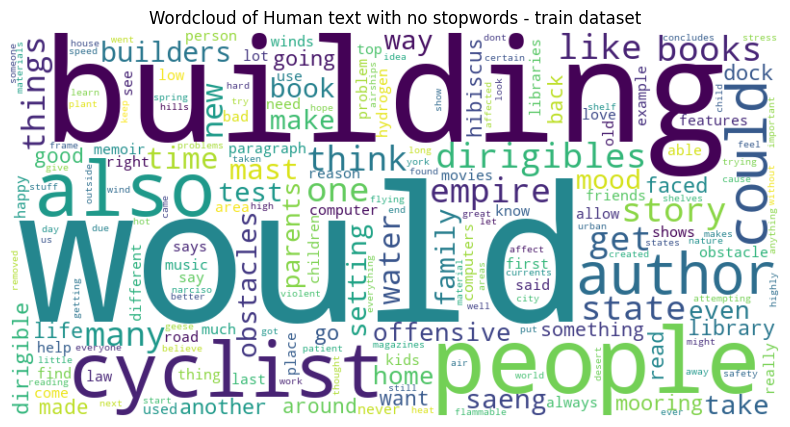

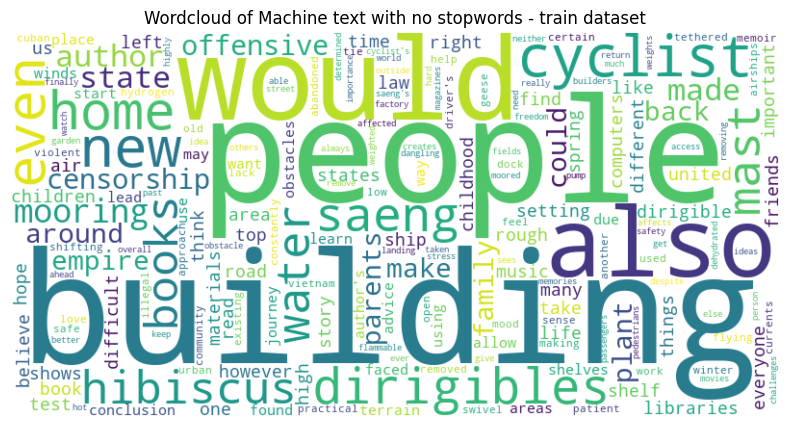

In [136]:
human_vocab, machine_vocab = generate_human_machine_vocab_counters(df_train, True)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(human_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Wordcloud of Human text with no stopwords - train dataset')
plt.show()


wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(machine_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Wordcloud of Machine text with no stopwords - train dataset')
plt.show()

### HUMAN AND AI -- ACADEMIC DOMAIN

In [143]:
df_train , _ = burrows_read_input_json("dev-labels")
df_train = df_train.loc[df_train['domain'] == 'academic',:]

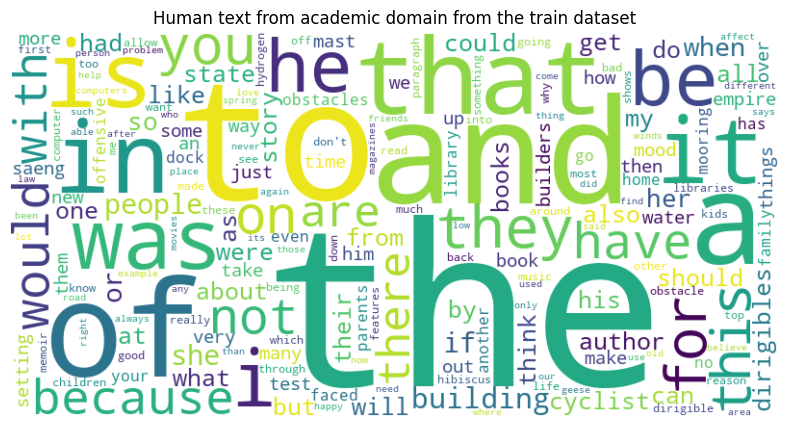

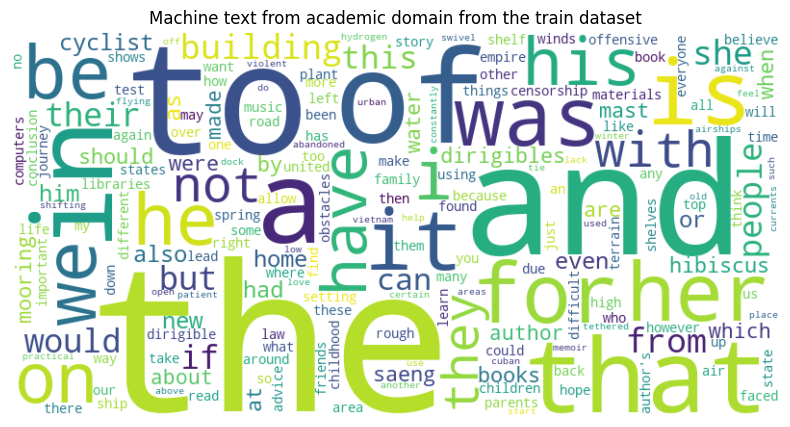

In [144]:
human_vocab, machine_vocab = generate_human_machine_vocab_counters(df_train, False)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(human_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Human text from academic domain from the train dataset')
plt.show()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(machine_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Machine text from academic domain from the train dataset')
plt.show()


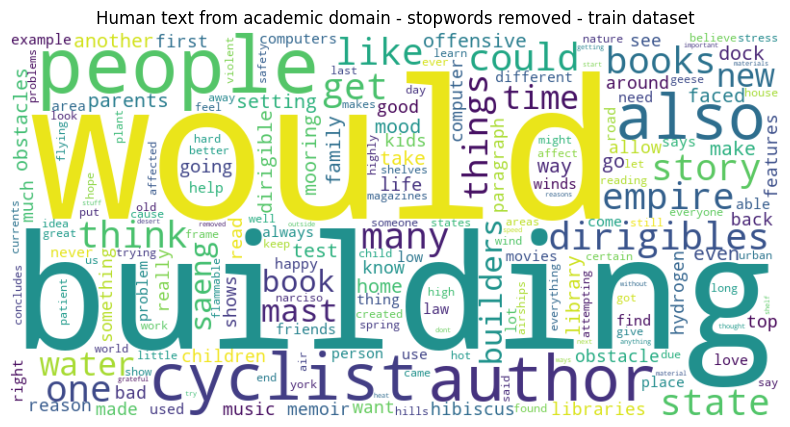

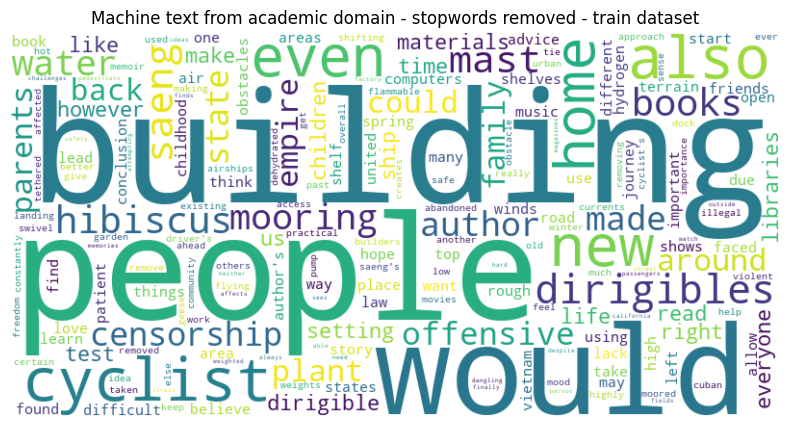

In [146]:
human_vocab, machine_vocab = generate_human_machine_vocab_counters(df_train, True)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(human_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Human text from academic domain - stopwords removed - train dataset')
plt.show()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(machine_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Machine text from academic domain - stopwords removed - train dataset')
plt.show()


### HUMAN AND AI -- NEWS DOMAIN

In [ ]:
df_train , _ = burrows_read_input_json("dev-labels")
df_train = df_train.loc[df_train['domain'] == 'news',:]
df_train

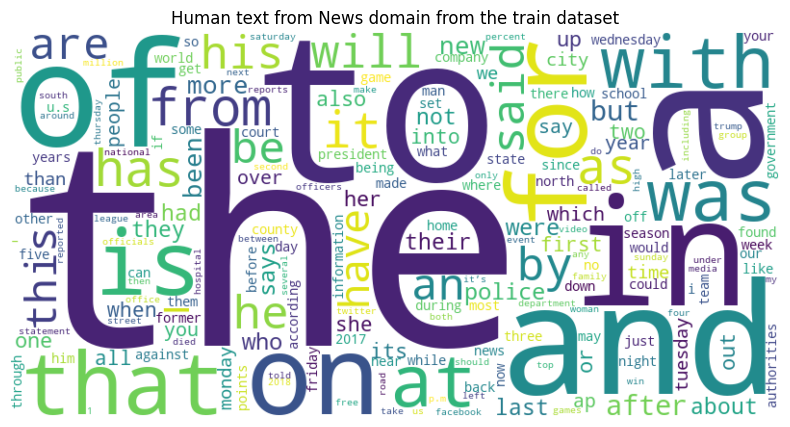

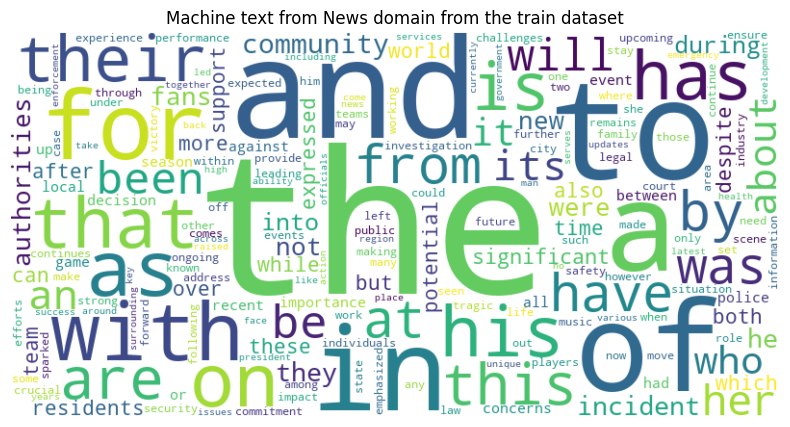

In [148]:
human_vocab, machine_vocab = generate_human_machine_vocab_counters(df_train, False)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(human_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Human text from News domain from the train dataset')
plt.show()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(machine_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Machine text from News domain from the train dataset')
plt.show()


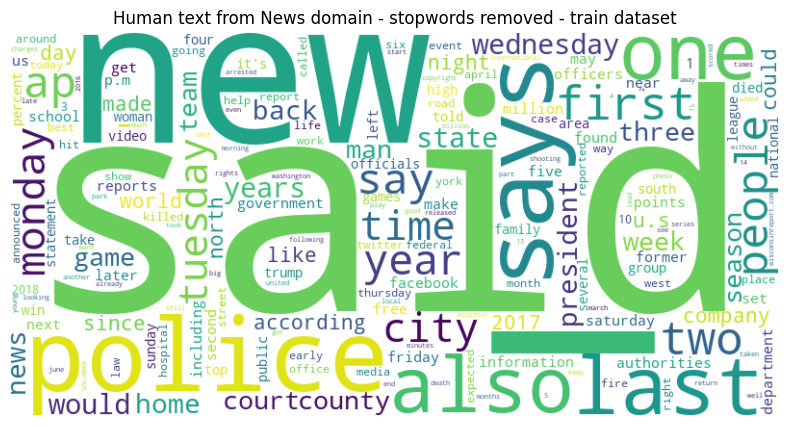

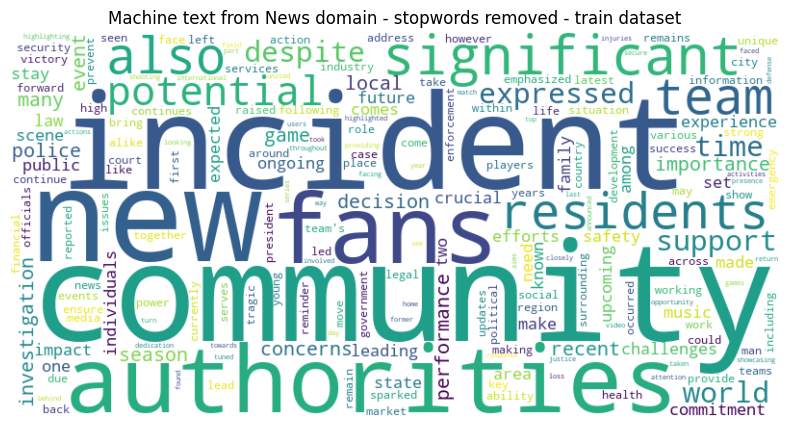

In [150]:
human_vocab, machine_vocab = generate_human_machine_vocab_counters(df_train, True)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(human_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Human text from News domain - stopwords removed - train dataset')
plt.show()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(machine_vocab)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Machine text from News domain - stopwords removed - train dataset')
plt.show()


# RNN

In [5]:
def create_alpaca_json(df):

    json_data = []

    for index , row in df_train.iterrows():
        json_data.append({"instruction":"Classify this sentence as whether written by human or machine ?", "input":row['sent'], "output":row['label']})

    with open('llama_train.json', 'w' , encoding='utf-8') as json_file:
        json.dump(json_data, json_file, indent=4, ensure_ascii=False)

    print("JSON file with labels created successfully!")

In [3]:
df_train, df_test = burrows_read_input_json("dev-labels")

df_train['label'] = df_train['label'].replace(['human', 'machine'], [0, 1]) # human encoded as 0 and machine as 1
df_test['label'] = df_test['label'].replace(['human', 'machine'], [0, 1]) # human encoded as 0 and machine as 1

C:\Users\joelj\AppData\Local\Temp\ipykernel_15992\3967844457.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_train['label'] = df_train['label'].replace(['human', 'machine'], [0, 1]) # human encoded as 0 and machine as 1
C:\Users\joelj\AppData\Local\Temp\ipykernel_15992\3967844457.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_test['label'] = df_test['label'].replace(['human', 'machine'], [0, 1]) # human encoded as 0 and machine as 1


In [7]:
import numpy as np
import sys
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import string


train_texts, test_texts, train_labels, test_labels = df_train['sent'], df_test['sent'], df_train['label'], df_test['label']

# Tokenize and build vocabulary
from collections import Counter

def tokenize(text):
    return [word.strip(string.punctuation) for word in text.lower().split()]

vocab = Counter()
for text in train_texts:
    vocab.update(tokenize(text))

vocab_size = 10000
word2idx = {word: idx + 2 for idx, (word, _) in enumerate(vocab.most_common(vocab_size))}
word2idx["<PAD>"] = 0
word2idx["<UNK>"] = 1

# Load GloVe embeddings (same as before)
embedding_dim = 100
embeddings = np.zeros((len(word2idx), embedding_dim))
with open("glove.6B.100d.txt", "r", encoding="utf-8") as f:
    for line in f:
        values = line.split()
        word = values[0]
        if word in word2idx:
            embeddings[word2idx[word]] = np.asarray(values[1:], dtype="float32")

# Convert text to sequences
def text_to_sequence(text, max_len=embedding_dim):
    tokens = tokenize(text)[:max_len]
    sequence = [word2idx.get(token, word2idx["<UNK>"]) for token in tokens]
    return sequence + [word2idx["<PAD>"]] * (max_len - len(sequence))

train_sequences = np.array([text_to_sequence(text) for text in train_texts])
test_sequences = np.array([text_to_sequence(text) for text in test_texts])

In [ ]:
# train_texts -- a pandas series consisiting of sentences from train set
# test_texts -- a pandas series consisiting of sentences from test set

# vocab--an instance of the counter class -- contains the words and their counts 
# len(vocab) -- 50281

# word2idx -- a dict with top 10000 words and their rank (most repeated is rank 2,3,4, so on)
# len(word2idx) -- 10002 ,ie, 10,000 words + padding and unknown

#embeddings -- a numpy array with shape 10002 x 100, each row representing a word using a 100-elemtn vector from glove

# values -- a list of length 101 containing a word and 100 elements of the vector representing the word

# train_sequences -- a numpy array. each row is a 100 long vector representing a sentence in the dataset. 
# test_sequences -- similar to train_sequence


In [27]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, SimpleRNN

model = Sequential([
    # Embedding layer with pre-trained GloVe weights
    Embedding(input_dim=len(word2idx), 
              output_dim=embedding_dim,  
              weights=[embeddings], 
              trainable=True),  # Freeze embeddings; set True to fine-tune
    # RNN layer
    SimpleRNN(128, return_sequences=False),
    # Dropout for regularization
    Dropout(0.5),
    # Fully connected layer
    Dense(2, activation="softmax")
])

model.compile(optimizer="adam", 
              loss="sparse_categorical_crossentropy", 
              metrics=["accuracy"])

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)         │ ?                      │     1,000,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_3 (SimpleRNN)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,000,200 (3.82 MB)

 Trainable params: 1,000,200 (3.82 MB)

 Non-trainable params: 0 (0.00 B)

In [28]:
history = model.fit(
    train_sequences, train_labels,
    epochs=10,
    batch_size=32,
    validation_data=(test_sequences, test_labels),
    verbose=1
)

Epoch 1/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 205s 30ms/step - accuracy: 0.6426 - loss: 0.6578 - val_accuracy: 0.6191 - val_loss: 0.6605
Epoch 2/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 211s 32ms/step - accuracy: 0.6575 - loss: 0.6435 - val_accuracy: 0.6191 - val_loss: 0.6670
Epoch 3/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 185s 28ms/step - accuracy: 0.6593 - loss: 0.6438 - val_accuracy: 0.6191 - val_loss: 0.6622
Epoch 4/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 211s 32ms/step - accuracy: 0.6566 - loss: 0.6461 - val_accuracy: 0.6191 - val_loss: 0.6623
Epoch 5/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 183s 28ms/step - accuracy: 0.6583 - loss: 0.6408 - val_accuracy: 0.6191 - val_loss: 0.6620
Epoch 6/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 202s 30ms/step - accuracy: 0.6582 - loss: 0.6461 - val_accuracy: 0.6191 - val_loss: 0.6534
Epoch 7/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 211s 32ms/step - accuracy: 0.6580 - loss: 0.6458 - val_accuracy: 0.6191 - val_loss: 0.6494
Epoch 8/10
6650/6650 ━━━━━━━━━━━━━━━━━━━━ 234s 35ms/step - accuracy: 

In [29]:

test_loss, test_accuracy = model.evaluate(test_sequences, test_labels)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6199 - loss: 0.6672
Test Accuracy: 61.91%


In [30]:
_ , df_eval = burrows_read_input_json("test")
eval_sequence = np.array([text_to_sequence(text) for text in df_eval['sent']])
test_predictions = model.predict(eval_sequence)

271/271 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step


In [25]:
test_predictions

array([[0.36080793, 0.6391921 ],
       [0.36080796, 0.63919204],
       [0.36080793, 0.6391921 ],
       ...,
       [0.36080793, 0.63919204],
       [0.36080796, 0.63919204],
       [0.36080796, 0.63919204]], dtype=float32)

In [31]:
test_pred_label_nums = np.argmax(test_predictions, axis=1)  # Shape: (num_test_samples,)
test_pred_labels = ["human" if label == 0 else "machine" for label in test_pred_label_nums]

In [32]:
set(test_pred_labels)

{'machine'}

In [ ]:
# def make_json(preds, df_test):

#     df_test['label'] = preds

#     df = df_test

#     # Create a dictionary to hold the final JSON structure
#     json_data = []

#     # Group by the id (before the hyphen) and aggregate sentences
#     for group_id, group in df.groupby(df['id'].str.split('-').str[0]):
#         entry = {
#             "id": int(group_id.split('-')[0]),  # Extract and convert group id to integer
#             "sent_and_label": [],
#             "domain": group['domain'].iloc[0]  # Assuming all rows in the group have the same domain
#         }
        
#         # Add sentences and their labels to the "sent_and_label" list
#         for _, row in group.iterrows():
#             entry["sent_and_label"].append([row['sent'], row['label']])
        
#         json_data.append(entry)

#     # Convert to JSON and save to a file
#     with open('../json_files/answer.json', 'w' , encoding='utf-8') as json_file:
#         json.dump(json_data, json_file, indent=4,ensure_ascii=False)

#     print("JSON file with labels created successfully!")

In [70]:
make_json(test_pred_labels, df_eval)

JSON file with labels created successfully!


# MULTI LAYER PERCEPTRON

In [29]:
df_train, df_test = burrows_read_input_json("dev-labels")
_ , df_eval = burrows_read_input_json("test")

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
import string
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score, accuracy_score
import pandas as pd

In [ ]:
import numpy as np

# Path to  GloVe file
glove_file = "glove.6B.100d.txt"

# Load 100-dimensional glove embeddings into a dictionary
embeddings = {}
with open(glove_file, "r", encoding="utf-8") as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = np.array(values[1:], dtype="float32")
        embeddings[word] = vector

print(f"Loaded {len(embeddings)} word vectors.")

# function to convert each sentence into a 100-long glove embedding
def sentence_to_vector(sentence, embeddings, embedding_dim=100):
    # Split sentence into words, lowercase for consistency
    words = [word.strip(string.punctuation) for word in sentence.lower().split()]
    
    # Get vectors for words in the sentence
    vectors = [embeddings.get(word, np.zeros(embedding_dim)) for word in words]
    
    # If no valid words, return a zero vector
    if not vectors or all(np.all(v == 0) for v in vectors):
        return np.zeros(embedding_dim)
    
    # Average the vectors of each token
    return np.mean(vectors, axis=0)

# function to create 2-D 
def make_input_arrays(sentence_series,label_series ):

    # extract sentences and labels 
    sentences = list(sentence_series)
    labels = [0 if label == 'human' else 1 for label in list(label_series)]

    # make 2-d matrix embeddings out of the sentences
    X = np.array([sentence_to_vector(s, embeddings) for s in sentences])
    y = np.array(labels)

    return X, y



Loaded 400000 word vectors.


In [ ]:
# function to downsample acadmeic articles, pass the fraction of academic articles need as input
def make_sampled_arrays(frac):
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    X, Y = make_input_arrays( df_sampled['sent'] , df_sampled['label'] ) 
    return X, Y


In [ ]:
# Best Runs \
# (0, 64, 32, 8): (0.345174103975296, 10) \
# (0, 64, 32): (0.3467032313346863, 12) \
# (0, 32): (0.34603044390678406, 30)

# get embeddings for test set
test_embedding, test_label = make_input_arrays(df_test['sent'], df_test['label'])

# make 2-D embedding matrices  from news articles only
X, Y = make_sampled_arrays(0)


# Initialize the model
model = Sequential()

# Input layer 
model.add(Dense(units=64, activation='relu', input_shape=(100,)))

model.add(Dense(units=32, activation='relu'))

model.add(Dense(units=8, activation='relu'))

# Output layer (1 neuron, sigmoid for binary classification)
model.add(Dense(units=1, activation='sigmoid'))

model.compile(optimizer='adam',  # Adaptive optimizer
              loss='binary_crossentropy',  # For binary classification
              metrics=['accuracy'])  # Track accuracy

history = model.fit(X, Y,
                    epochs=10,  # Number of passes through data
                    batch_size=32,  # Samples per update
                    validation_data=(test_embedding, test_label),  #validate against phase-1 test data
                    verbose=1)  # Show progress

c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.7506 - loss: 0.4957 - val_accuracy: 0.8297 - val_loss: 0.3787
Epoch 2/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8403 - loss: 0.3594 - val_accuracy: 0.8311 - val_loss: 0.3757
Epoch 3/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8434 - loss: 0.3530 - val_accuracy: 0.8253 - val_loss: 0.3908
Epoch 4/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8448 - loss: 0.3425 - val_accuracy: 0.8354 - val_loss: 0.3641
Epoch 5/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8468 - loss: 0.3366 - val_accuracy: 0.8422 - val_loss: 0.3568
Epoch 6/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8547 - loss: 0.3255 - val_accuracy: 0.8302 - val_loss: 0.3706
Epoch 7/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8549 - loss: 0.3240 - val_accuracy: 0.8389 - val_loss: 0.3622
Epoch 8/10
411/411 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8575 - loss: 0.3194 - val_accuracy: 0

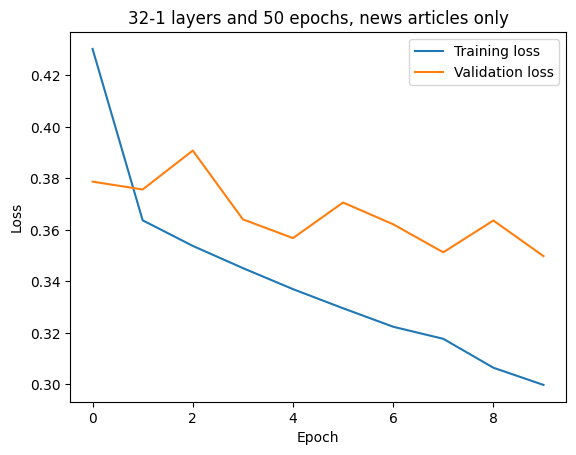

In [129]:
plt.plot(history.epoch, history.history['loss'], label='Training loss')
plt.plot(history.epoch, history.history['val_loss'], label='Validation loss')
plt.title('32-1 layers and 50 epochs, news articles only')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [130]:
test_sequences, test_labels = make_input_arrays(df_test['sent'], df_test['label'])
X_eval, _ = make_input_arrays(df_eval['sent'], df_test['label'])


kappa_score = cohen_kappa_score([0 if pred < 0.5 else 1 for pred in model.predict(test_sequences)], test_labels) 
print(f"Test Kappa Score: {kappa_score * 100:.2f}%")
accuracy = accuracy_score([0 if pred < 0.5 else 1 for pred in model.predict(test_sequences)], test_labels) 
print(f"Accuracy Score: {accuracy * 100:.2f}%")


eval_pred = model.predict(X_eval)
eval_labels = ['human' if pred < 0.5 else 'machine' for pred in eval_pred ]
make_json(eval_labels, df_eval)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Test Kappa Score: 67.72%
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Accuracy Score: 84.69%
271/271 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
JSON file with labels created successfully!
ZIP file 'answer.zip' created successfully!


# MLP GRIDSEARCH

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
import string
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score, accuracy_score
import pandas as pd
import pickle

# get the dataframes out of the json file
df_train, df_test = burrows_read_input_json("dev-labels")
_ , df_eval = burrows_read_input_json("test")


# create embeddings of the test set to make predictions on
X_val, Y_val = make_input_arrays(df_test['sent'], df_test['label'])


In [ ]:
import itertools

# function to generate parameter space for exploring verious hyperparameters. Pyramid shape of network enforced
def generate_parameter_grid(num_of_layers):
    # Fractions for dropout or other purposes
    frac = [0, 0.2, 0.4, 0.6, 0.8, 1]
    # Available layer sizes (already sorted descending)
    layers = [64, 32, 16, 8]

    results = []

    for f in frac:
        # Generate all strictly decreasing combinations of layer sizes
        if num_of_layers <= len(layers):
            layer_combos = itertools.combinations(layers, num_of_layers)
            for combo in layer_combos:
                results.append((f,) + combo)

    return results


In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import numpy as np

# function to automate model build based on param space created

def build_and_train_model(arch, X_val, Y_val, epochs=50):

    model = Sequential()

    # First hidden layer with input shape
    model.add(Dense( units=arch[1], activation='relu',input_shape=(100,) ) )
    
    # Additional hidden layers (if any)
    if len(arch) > 2:

        for units in arch[2:]:
            model.add(Dense(units=units, activation='relu'))
    
    # Output layer
    model.add(Dense(units=1, activation='sigmoid'))
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    X_train, Y_train = make_sampled_arrays(arch[0])
    
    history = model.fit(X_train, Y_train,
                        epochs=epochs,
                        batch_size=32,
                        validation_data=(X_val, Y_val),
                        verbose=0)

    kappa_score = cohen_kappa_score([0 if pred < 0.5 else 1 for pred in model.predict(X_val)], Y_val)

    return history, kappa_score



Training model: (0, 64)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0, 32)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0, 16)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0, 8)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.2, 64)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.2, 32)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Training model: (0.2, 16)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.2, 8)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.4, 64)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.4, 32)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.4, 16)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Training model: (0.4, 8)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Training model: (0.6, 64)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Training model: (0.6, 32)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Training model: (0.6, 16)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training model: (0.6, 8)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training model: (0.8, 64)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training model: (0.8, 32)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Training model: (0.8, 16)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Training model: (0.8, 8)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Training model: (1, 64)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Training model: (1, 32)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Training model: (1, 16)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Training model: (1, 8)


c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
History object saved
Kappa scores saved


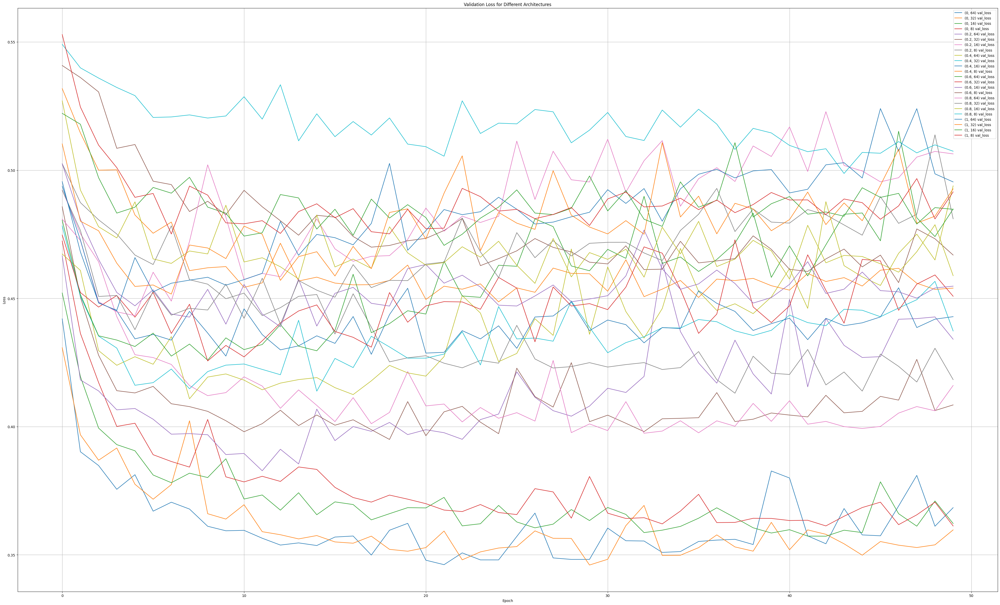

In [ ]:
# Try different architectures
arch_object = generate_parameter_grid(1)

histories = {}
kappa_scores = {}

# iteratively perform model runs for each param in param space and store results in a dict
for arch in generate_parameter_grid(1):
    print(f"Training model: {arch}")
    history, kappa_score = build_and_train_model(arch, X_val, Y_val, epochs=50)
    histories[arch] = history
    kappa_scores[arch] =  kappa_score

# dump details of model run into a pickle file
with open('history.pkl', 'wb') as f:
    pickle.dump(histories, f)
    print('History object saved')

# dump kappa scores of models against validation set into a pickle file
with open('kappa_scores.pkl', 'wb') as f:
    pickle.dump(kappa_scores, f)
    print('Kappa scores saved')



# Plot all model's val losses
plt.figure(figsize=(50, 30))
for name, hist in histories.items():
    plt.plot(hist.epoch, hist.history['val_loss'], label=f'{name} val_loss')


plt.title('Validation Loss for Different Architectures')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.savefig(f'validation_loss_.png')
plt.show()

c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


History object saved
Kappa scores saved


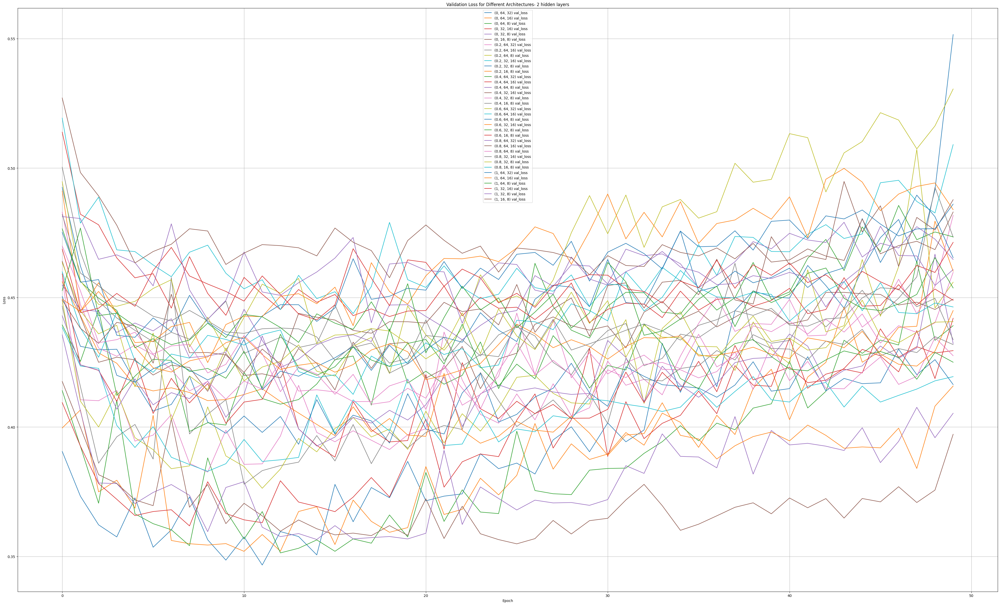

In [80]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import numpy as np
from joblib import Parallel, delayed
import pickle
from sklearn.metrics import cohen_kappa_score

# Assume test_embedding, test_label, X, Y, make_sampled_arrays, generate_parameter_grid are defined

def build_and_train_model(arch, X_val, Y_val, epochs=50):
    model = Sequential()
    model.add(Dense(units=arch[1], activation='relu', input_shape=(100,)))
    if len(arch) > 2:
        for units in arch[2:]:
            model.add(Dense(units=units, activation='relu'))
    model.add(Dense(units=1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    X_train, Y_train = make_sampled_arrays(arch[0])
    history = model.fit(X_train, Y_train,
                        epochs=epochs,
                        batch_size=32,
                        validation_data=(X_val, Y_val),
                        verbose=0)
    
    predictions = model.predict(X_val, verbose=0)
    kappa_score = cohen_kappa_score([0 if pred < 0.5 else 1 for pred in predictions], Y_val)
    
    return history, kappa_score

# Parallelized training
def train_single_architecture(arch, X_val, Y_val, epochs=50):
    print(f"Training model: {arch}")
    return arch, build_and_train_model(arch, X_val, Y_val, epochs=50)

arch_object = generate_parameter_grid(2)
histories = {}
kappa_scores = {}

# Run in parallel
results = Parallel(n_jobs=6)(delayed(train_single_architecture)(arch, X_val, Y_val, epochs=50) 
                             for arch in arch_object)

# Collect results
for arch, (history, kappa_score) in results:
    histories[arch] = history
    kappa_scores[arch] = kappa_score

# Save histories and kappa scores
with open('history_2.pkl', 'wb') as f:
    pickle.dump(histories, f)
    print('History object saved')

with open('kappa_scores_2.pkl', 'wb') as f:
    pickle.dump(kappa_scores, f)
    print('Kappa scores saved')

# Plot validation losses
plt.figure(figsize=(50, 30))
for name, hist in histories.items():
    plt.plot(hist.epoch, hist.history['val_loss'], label=f'{name} val_loss')

plt.title('Validation Loss for Different Architectures- 2 hidden layers')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.savefig('validation_loss_2.png')
plt.show()

In [83]:
max(kappa_scores.values())

np.float64(0.6662379541790093)

History object saved
Kappa scores saved


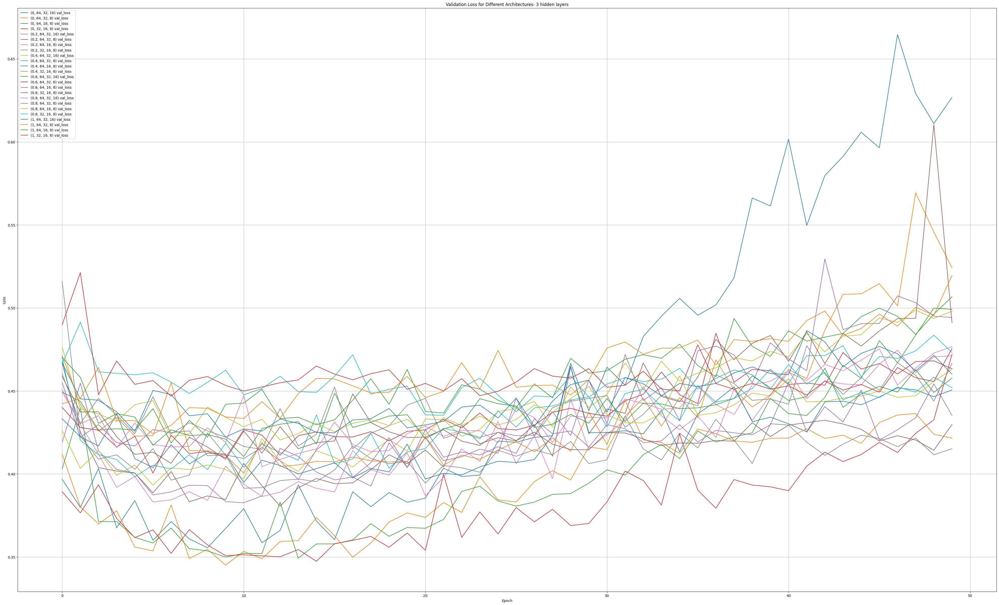

In [84]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import numpy as np
from joblib import Parallel, delayed
import pickle
from sklearn.metrics import cohen_kappa_score

# Assume test_embedding, test_label, X, Y, make_sampled_arrays, generate_parameter_grid are defined

def build_and_train_model(arch, X_val, Y_val, epochs=50):
    model = Sequential()
    model.add(Dense(units=arch[1], activation='relu', input_shape=(100,)))
    if len(arch) > 2:
        for units in arch[2:]:
            model.add(Dense(units=units, activation='relu'))
    model.add(Dense(units=1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    X_train, Y_train = make_sampled_arrays(arch[0])
    history = model.fit(X_train, Y_train,
                        epochs=epochs,
                        batch_size=32,
                        validation_data=(X_val, Y_val),
                        verbose=0)
    
    predictions = model.predict(X_val, verbose=0)
    kappa_score = cohen_kappa_score([0 if pred < 0.5 else 1 for pred in predictions], Y_val)
    
    return history, kappa_score

# Parallelized training
def train_single_architecture(arch, X_val, Y_val, epochs=50):
    print(f"Training model: {arch}")
    return arch, build_and_train_model(arch, X_val, Y_val, epochs=50)

arch_object = generate_parameter_grid(3)
histories = {}
kappa_scores = {}

# Run in parallel
results = Parallel(n_jobs=6)(delayed(train_single_architecture)(arch, X_val, Y_val, epochs=50) 
                             for arch in arch_object)

# Collect results
for arch, (history, kappa_score) in results:
    histories[arch] = history
    kappa_scores[arch] = kappa_score

# Save histories and kappa scores
with open('history_3.pkl', 'wb') as f:
    pickle.dump(histories, f)
    print('History object saved')

with open('kappa_scores_3.pkl', 'wb') as f:
    pickle.dump(kappa_scores, f)
    print('Kappa scores saved')

# Plot validation losses
plt.figure(figsize=(50, 30))
for name, hist in histories.items():
    plt.plot(hist.epoch, hist.history['val_loss'], label=f'{name} val_loss')

plt.title('Validation Loss for Different Architectures- 3 hidden layers')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.savefig('validation_loss_3.png')
plt.show()

## PICKLE FILE ANALYSE

In [ ]:
# function to analyse best models from different runs by extracting info from pickle files
def extract_best_run_from_pickle_file(filename):
    with open(filename, 'rb') as file:
        history_3 = pickle.load(file)
    history_3_unpacked = {key:history_3[key].history['val_loss']  for key in history_3.keys()}
    history_3_best_train = {key : ( min(history_3_unpacked[key]), history_3_unpacked[key].index(min(history_3_unpacked[key]))+1 )  for key in history_3_unpacked}
    return history_3_best_train

extract_best_run_from_pickle_file('history_3.pkl')

{(0, 64, 32, 16): (0.3555716276168823, 9),
 (0, 64, 32, 8): (0.345174103975296, 10),
 (0, 64, 16, 8): (0.34927865862846375, 14),
 (0, 32, 16, 8): (0.34740978479385376, 15),
 (0.2, 64, 32, 16): (0.38265901803970337, 11),
 (0.2, 64, 32, 8): (0.3806758224964142, 13),
 (0.2, 64, 16, 8): (0.38311731815338135, 6),
 (0.2, 32, 16, 8): (0.39142709970474243, 11),
 (0.4, 64, 32, 16): (0.39332354068756104, 6),
 (0.4, 64, 32, 8): (0.3983669877052307, 5),
 (0.4, 64, 16, 8): (0.3949699103832245, 11),
 (0.4, 32, 16, 8): (0.40052589774131775, 11),
 (0.6, 64, 32, 16): (0.4187068045139313, 7),
 (0.6, 64, 32, 8): (0.40054014325141907, 6),
 (0.6, 64, 16, 8): (0.39664769172668457, 14),
 (0.6, 32, 16, 8): (0.4064491391181946, 7),
 (0.8, 64, 32, 16): (0.40440523624420166, 12),
 (0.8, 64, 32, 8): (0.4147847592830658, 12),
 (0.8, 64, 16, 8): (0.4204755127429962, 13),
 (0.8, 32, 16, 8): (0.4353896975517273, 22),
 (1, 64, 32, 16): (0.42226850986480713, 10),
 (1, 64, 32, 8): (0.42422205209732056, 6),
 (1, 64, 16, 

Best Runs \
(0, 64, 32, 8): (0.345174103975296, 10) \
(0, 64, 32): (0.3467032313346863, 12) \
(0, 32): (0.34603044390678406, 30)

In [117]:
with open('history_3.pkl', 'rb') as file:
    history_3 = pickle.load(file)

In [119]:
history_3[(0,32,16,8)].history['val_loss']

[0.3892842233181,
 0.3765883445739746,
 0.3935369551181793,
 0.37321001291275024,
 0.36170196533203125,
 0.3663712739944458,
 0.3521774113178253,
 0.36648160219192505,
 0.3572821617126465,
 0.3508114516735077,
 0.3513420522212982,
 0.35072246193885803,
 0.35015034675598145,
 0.35452574491500854,
 0.34740978479385376,
 0.35802024602890015,
 0.3600365221500397,
 0.36239635944366455,
 0.3558892011642456,
 0.3644809424877167,
 0.3540707230567932,
 0.3999113440513611,
 0.3618495762348175,
 0.3771364986896515,
 0.36390742659568787,
 0.37977850437164307,
 0.37117063999176025,
 0.3787338435649872,
 0.3689809739589691,
 0.37018248438835144,
 0.38319069147109985,
 0.40173012018203735,
 0.39608871936798096,
 0.38126498460769653,
 0.424203485250473,
 0.3902719020843506,
 0.37938550114631653,
 0.39663317799568176,
 0.3933457136154175,
 0.3922885060310364,
 0.38992738723754883,
 0.4046890139579773,
 0.41314008831977844,
 0.4074868857860565,
 0.41172394156455994,
 0.4190315902233124,
 0.4129831492900

# LSTM

In [94]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
import string
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score, accuracy_score
import pandas as pd

import numpy as np
import pandas as pd
import spacy
import textstat
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Bidirectional, Dense, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import train_test_split
from nltk.tokenize import word_tokenize
import nltk
from tensorflow.keras.utils import pad_sequences
from tensorflow.keras.layers import InputLayer

In [93]:
df_train, df_test = burrows_read_input_json("dev-labels")
_ , df_eval = burrows_read_input_json("test")

glove_file = "glove.6B.100d.txt"

# Load embeddings into a dictionary
embeddings = {}
with open(glove_file, "r", encoding="utf-8") as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = np.array(values[1:], dtype="float32")
        embeddings[word] = vector

print(f"Loaded {len(embeddings)} word vectors.")

Loaded 400000 word vectors.


In [ ]:
# function to downsample academic articles. pass frac argument to choose downsampling percent
def make_sampled_arrays(frac):
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    X, Y = make_input_arrays( df_sampled['sent'] , df_sampled['label'] ) 
    return X, Y

# converts sentences to 2-D Glove embedding matrices. max_len and pad_sequences used to ensure consistency of sentence length 
def sentence_to_embedding(sentence, maxlen=50, embedding_dim=100, embeddings = embeddings):
    if not sentence or not isinstance(sentence, str):
        return np.zeros((1, maxlen, embedding_dim), dtype='float32')
    words = word_tokenize(sentence.lower())
    vectors = [embeddings.get(word, np.zeros(embedding_dim)) for word in words]
    if not vectors or all(np.all(v == 0) for v in vectors):
        return np.zeros((1, maxlen, embedding_dim), dtype='float32')
    vectors = np.array(vectors)
    return pad_sequences([vectors], maxlen=maxlen, dtype='float32', padding='post', truncating='post')

# creates a 3-D tensor by stacking those 2-D matrices together
def create_tensor_for_lstm(sentences, max_len):
    # Pass max_len to sentence_to_embedding using a lambda function
    embedding_matrices = sentences.apply(
        lambda x: sentence_to_embedding(x, maxlen=max_len)
    ).tolist()
    
    # Stack the matrices into a single 3D NumPy array
    return np.vstack(embedding_matrices)

# encodes labels numericallly
def encode_labels(labels):
    return np.array([0 if label == 'human' else 1 for label in labels])

# wrapper func to create sampled input embedding tensors for lstm
def make_sampled_inputs_for_lstm(frac, max_len):
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    train_embedding , train_labels = create_tensor_for_lstm( df_sampled['sent'],max_len ) , encode_labels(df_sampled['label'])
    return train_embedding , train_labels

In [97]:
train_embeddings , train_labels = make_sampled_inputs_for_lstm(0 , 50)
val_embeddings , val_labels = create_tensor_for_lstm(df_test['sent'], 50) , encode_labels(df_test['label'])
test_embeddings , test_labels = create_tensor_for_lstm(df_eval['sent'], 50) , encode_labels(df_eval['label'])

c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 64)             │        42,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,457 (169.75 KB)

 Trainable params: 43,457 (169.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 16s 34ms/step - accuracy: 0.6609 - loss: 0.6236 - val_accuracy: 0.7981 - val_loss: 0.4393
Epoch 2/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.8286 - loss: 0.3871 - val_accuracy: 0.8574 - val_loss: 0.3335
Epoch 3/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.8613 - loss: 0.3203 - val_accuracy: 0.8773 - val_loss: 0.3039
Epoch 4/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - accuracy: 0.8721 - loss: 0.3003 - val_accuracy: 0.8816 - val_loss: 0.2873
Epoch 5/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.8879 - loss: 0.2638 - val_accuracy: 0.8848 - val_loss: 0.2798
Epoch 6/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.8937 - loss: 0.2590 - val_accuracy: 0.8710 - val_loss: 0.2944
Epoch 7/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.9060 - loss: 0.2348 - val_accuracy: 0.8947 - val_loss: 0.2567
Epoch 8/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.9142 - loss: 0.2149 - val_acc

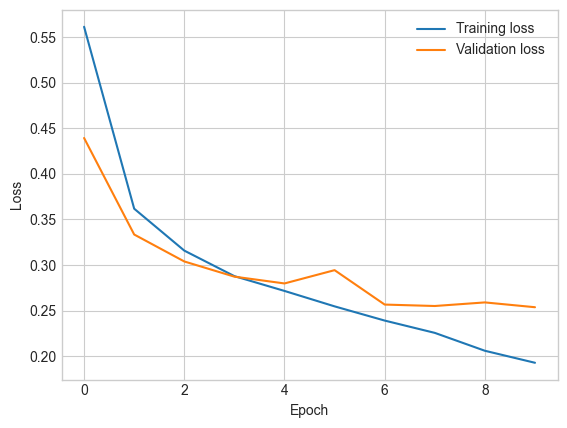

In [ ]:

# Inputs
# Defining the model using Sequential API
model = Sequential([
    InputLayer(input_shape=(50, 100), name='embed_input'),
    LSTM(64, return_sequences=False),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(4, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


model.summary()


history = model.fit(
    train_embeddings, train_labels,
    validation_data=(val_embeddings, val_labels),
    epochs=10,
    batch_size=64,
    # callbacks=[early_stopping],
    verbose=1 )


plt.plot(history.epoch, history.history['loss'], label='Training loss')
plt.plot(history.epoch, history.history['val_loss'], label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [99]:
eval_pred = model.predict(test_embeddings)
eval_labels = ['human' if pred < 0.5 else 'machine' for pred in eval_pred ]
make_json(eval_labels, df_eval)

271/271 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step
JSON file with labels created successfully!
ZIP file 'answer.zip' created successfully!


# LSTM Parameter Grid

In [51]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
import string
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score, accuracy_score
import pandas as pd

import numpy as np
import pandas as pd
import spacy
import textstat
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Bidirectional, Dense, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import train_test_split
from nltk.tokenize import word_tokenize
import nltk
from tensorflow.keras.utils import pad_sequences
from tensorflow.keras.layers import InputLayer

df_train, df_test = burrows_read_input_json("dev-labels")
_ , df_eval = burrows_read_input_json("test")

# glove_file = "glove.6B.100d.txt"

# Load embeddings into a dictionary
# embeddings = {}
# with open(glove_file, "r", encoding="utf-8") as f:
#     for line in f:
#         values = line.split()
#         word = values[0]
#         vector = np.array(values[1:], dtype="float32")
#         embeddings[word] = vector

print(f"Loaded {len(embeddings)} word vectors.")

def make_sampled_arrays(frac):
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    X, Y = make_input_arrays( df_sampled['sent'] , df_sampled['label'] ) 
    return X, Y


def sentence_to_embedding(sentence, maxlen=50, embedding_dim=100, embeddings = embeddings):
    if not sentence or not isinstance(sentence, str):
        return np.zeros((1, maxlen, embedding_dim), dtype='float32')
    words = word_tokenize(sentence.lower())
    vectors = [embeddings.get(word, np.zeros(embedding_dim)) for word in words]
    if not vectors or all(np.all(v == 0) for v in vectors):
        return np.zeros((1, maxlen, embedding_dim), dtype='float32')
    vectors = np.array(vectors)
    return pad_sequences([vectors], maxlen=maxlen, dtype='float32', padding='post', truncating='post')


def create_tensor_for_lstm(sentences, max_len):
    # Pass max_len to sentence_to_embedding using a lambda function
    embedding_matrices = sentences.apply(
        lambda x: sentence_to_embedding(x, maxlen=max_len)
    ).tolist()
    
    # Stack the matrices into a single 3D NumPy array
    return np.vstack(embedding_matrices)


def encode_labels(labels):
    return np.array([0 if label == 'human' else 1 for label in labels])

Loaded 0 word vectors.


In [ ]:
import itertools
import random


def make_sampled_inputs_for_lstm(frac, max_len):
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    train_embedding , train_labels = create_tensor_for_lstm( df_sampled['sent'],max_len ) , encode_labels(df_sampled['label'])
    return train_embedding , train_labels


# generate param grid to explore diff architectures
def generate_parameter_grid():
    # Fractions for dropout or other purposes
    frac = [0, 0.5 , 1]

    max_len = [50, 100]
    # Available layer sizes for LSTM (already sorted descending)
    lstm_layers = [64, 32, 16, 8]
    # Available layer sizes for Dense (already sorted descending)
    dense_layers = [32, 16, 8 , 4]

    results = []

    # Loop through all frac values
    for f in frac:

        for length in max_len:
        # Loop through LSTM layer sizes
            for lstm_size in lstm_layers:
                # Loop through first Dense layer sizes

                        # Add the combination to results
                    results.append([f,length , lstm_size])


    return results
    #return  random.sample(results, 30)





24

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import numpy as np


# to build model automatedly

def build_and_train_model(arch, X_val, Y_val, epochs=20):

    model = Sequential()

    model.add(InputLayer(input_shape=(arch[1], 100), name='embed_input'))

    model.add(LSTM(arch[2], return_sequences=False))

    # First hidden layer with input shape
    
    # Additional hidden layers (if any)
    if len(arch) > 3 :

        for units in arch[3:]:
            model.add(Dense(units=units, activation='relu'))
    
    # Output layer
    model.add(Dense(units=1, activation='sigmoid'))
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    (train_embedding , train_labels)  = make_sampled_inputs_for_lstm( arch[0], arch[1])
    (val_embedding, val_labels) = create_tensor_for_lstm(X_val , arch[1]) , encode_labels(Y_val)

    
    history = model.fit(train_embedding , train_labels,
                        epochs=epochs,
                        batch_size=64,
                        validation_data=(val_embedding, val_labels),
                        verbose=1)

    kappa_score = cohen_kappa_score([0 if pred < 0.5 else 1 for pred in model.predict(val_embedding)], val_labels)

    return history, kappa_score



c:\Users\joelj\Documents\GitHub\ALTA2024_SharedTask\code\myenv\lib\site-packages\keras\src\layers\core\input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
# Try different architectures
arch_object = generate_parameter_grid()

histories = {}
kappa_scores = {}

for arch in generate_parameter_grid():
    print(f"Training model: {arch}")
    history, kappa_score = build_and_train_model(arch, df_test['sent'], df_test['label'], epochs=20)
    histories[arch] = history
    kappa_scores[arch] =  kappa_score


with open('history_lstm_3.pkl', 'wb') as f:
    pickle.dump(histories, f)
    print('History object saved')


with open('kappa_scores_lstm_3.pkl', 'wb') as f:
    pickle.dump(kappa_scores, f)
    print('Kappa scores saved')


# Plot all losses
plt.figure(figsize=(50, 30))
for name, hist in histories.items():
    plt.plot(hist.epoch, hist.history['val_loss'], label=f'{name} val_loss')


plt.title('Validation Loss for Different Architectures')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.savefig(f'validation_loss_.png')
plt.show()

## PICKLE FILE ANALYSIS

In [ ]:
import pickle

filename = 'C:/Users/joelj/Documents/GitHub/ALTA2024_SharedTask/lstm/lstm_grir_run_files/history_lstm_final.pkl'

# to analyse pickle file data to find best model params
def extract_best_run_from_pickle_file(filename):
    with open(filename, 'rb') as file:
        history_3 = pickle.load(file)
    history_3_unpacked = {key:history_3[key].history['val_loss']  for key in history_3.keys()}
    history_3_best_train = {key : ( min(history_3_unpacked[key]), history_3_unpacked[key].index(min(history_3_unpacked[key]))+1 )  for key in history_3_unpacked}
    return history_3_best_train


In [91]:
run_dict = extract_best_run_from_pickle_file(filename)
run_dict

{(0, 50, 64, 16, 8, 4): (0.24713106453418732, 10),
 (0, 100, 64, 32, 4, 4): (0.2611064314842224, 26),
 (0, 100, 64, 32, 16): (0.2595018446445465, 27),
 (0, 50, 64, 32, 4): (0.25759589672088623, 8),
 (0, 100, 16, 8, 4): (0.5405503511428833, 23),
 (0, 100, 32, 16): (0.2636631429195404, 43),
 (0, 50, 64, 4): (0.24742990732192993, 11),
 (0, 50, 32, 4): (0.2697194218635559, 11),
 (0, 50, 64, 32): (0.25430724024772644, 10),
 (0, 50, 32, 8): (0.2727252244949341, 7),
 (0, 100, 32): (0.26855164766311646, 39),
 (0, 50, 16): (0.27917054295539856, 13),
 (0, 50, 8): (0.28376293182373047, 21),
 (0, 50, 64): (0.26135537028312683, 9),
 (0, 50, 32): (0.2551563084125519, 10)}

LSTM Best run is (0, 50, 64, 16, 8, 4): (0.24713106453418732, 10)

In [88]:
import pickle

filename = 'C:/Users/joelj/Documents/GitHub/ALTA2024_SharedTask/lstm/lstm_grir_run_files/kappa_scores_lstm_1.pkl'

with open(filename, 'rb') as file:
    kappa_scores = pickle.load(file)

# def extract_best_run_from_pickle_file(filename):
#     with open(filename, 'rb') as file:
#         history_3 = pickle.load(file)
#     history_3_unpacked = {key:history_3[key].history['val_loss']  for key in history_3.keys()}
#     history_3_best_train = {key : ( min(history_3_unpacked[key]), history_3_unpacked[key].index(min(history_3_unpacked[key]))+1 )  for key in history_3_unpacked}
#     return history_3_best_train

In [89]:
kappa_scores

{(0, 50, 64): np.float64(0.7836696904516973),
 (0, 50, 32): np.float64(0.7656645441786272),
 (0, 50, 16): np.float64(0.767686061089318),
 (0, 50, 8): np.float64(0.7449496909029771),
 (0, 100, 64): np.float64(0.0),
 (0, 100, 32): np.float64(0.7399364462194441),
 (0, 100, 16): np.float64(0.0),
 (0, 100, 8): np.float64(0.17401581500050267),
 (0.5, 50, 64): np.float64(0.7223693791130557),
 (0.5, 50, 32): np.float64(0.6985630659513518),
 (0.5, 50, 16): np.float64(0.6732511409304544),
 (0.5, 50, 8): np.float64(0.6007182594544063),
 (0.5, 100, 64): np.float64(0.6975174053576302),
 (0.5, 100, 32): np.float64(0.6675286543054106),
 (0.5, 100, 16): np.float64(0.6579351397572251),
 (0.5, 100, 8): np.float64(0.6076703537461998),
 (1, 50, 64): np.float64(0.6836676994396855),
 (1, 50, 32): np.float64(0.6614842098461141),
 (1, 50, 16): np.float64(0.6234914847382487),
 (1, 50, 8): np.float64(0.5995580925344253),
 (1, 100, 64): np.float64(0.6775418939319229),
 (1, 100, 32): np.float64(0.6395270625134755

# Burrows-delta + PCA-KNN + Tf-Idf + MLP + LSTM (Incomplete)

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import os, re, random
from glob import glob
from faststylometry.corpus import Corpus
from faststylometry import tokenise_remove_pronouns_en
from faststylometry import calculate_burrows_delta
from faststylometry import predict_proba, calibrate, get_calibration_curve
import numpy as np

from faststylometry.corpus import Corpus
from faststylometry import tokenise_remove_pronouns_en
from faststylometry import calculate_burrows_delta
from faststylometry import predict_proba, calibrate, get_calibration_curve
from sklearn.naive_bayes import MultinomialNB, ComplementNB
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, cohen_kappa_score
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import textstat # https://pypi.org/project/textstat/
import pandas as pd
import json
import math

# Read the input train and test json files into train and test dataframes
def burrows_read_input_json(phase):

    df_train = pd.read_json('../alta2024_public_data/train.json')
    df_train = df_train.explode('sent_and_label')
    df_train = df_train.explode('sent_and_label')
    df_train = pd.DataFrame({'id':df_train['id'].iloc[1::2],
                        'domain':df_train['domain'].iloc[1::2],
                        'sent':df_train['sent_and_label'].iloc[::2].values, 
                        'label':df_train['sent_and_label'].iloc[1::2].values})                     
    df_train['index'] = df_train.groupby('id').cumcount() + 1
    df_train['id'] = df_train['id'].astype(str)  +  "-"  +  df_train['index'].astype(str) 
    df_train = df_train.drop('index', axis = 1)

    if phase == "dev-labels" :
        
        df_test = pd.read_json('../alta2024_public_data/phase1_test_with_labels.json')
        df_test = df_test.explode('sent_and_label')
        df_test = df_test.explode('sent_and_label')
        df_test = pd.DataFrame({'id':df_test['id'].iloc[1::2],
                            'domain':df_test['domain'].iloc[1::2],
                            'sent':df_test['sent_and_label'].iloc[::2].values, 
                            'label':df_test['sent_and_label'].iloc[1::2].values})
        #Generating unique IDs
        df_test['index'] = df_test.groupby('id').cumcount() + 1
        df_test['id'] = df_test['id'].astype(str)  +  "-"  +  df_test['index'].astype(str) 
        df_test = df_test.drop('index', axis = 1)


    elif phase == "dev-no-labels":

        df_test = pd.read_json('../alta2024_public_data/phase1_test_without_labels.json')
        df_test = df_test.explode('sent')
        df_test = pd.DataFrame({'id':df_test['id'],
                            'domain':df_test['domain'],
                            'sent':df_test['sent'].values})
        df_test['index'] = df_test.groupby('id').cumcount() + 1
        df_test['id'] = df_test['id'].astype(str)  +  "-"  +  df_test['index'].astype(str) 
        df_test = df_test.drop('index', axis = 1)
        df_test['label'] = ["1" for i in df_test['id']]

    elif phase == "test":

        df_test = pd.read_json('../alta2024_public_data/phase2_test_without_labels.json')
        df_test = df_test.explode('sent')
        df_test = pd.DataFrame({'id':df_test['id'],
                            'domain':df_test['domain'],
                            'sent':df_test['sent'].values})
        df_test['index'] = df_test.groupby('id').cumcount() + 1
        df_test['id'] = df_test['id'].astype(str)  +  "-"  +  df_test['index'].astype(str) 
        df_test = df_test.drop('index', axis = 1)
        df_test['label'] = ["1" for i in df_test['id']]

    else:
        print("Specify phase")
        return None
 
    return df_train, df_test

# Returns train and test corpus when train and test dataframes are passed in
def burrows_corpus_make(df_train, df_test):
    train_corpus = Corpus()
    for label,id,sent in zip(df_train['label'],df_train['id'],df_train['sent']):
        train_corpus.add_book(label, str(id), sent)

    test_corpus = Corpus()
    for label,id,sent in zip(df_test['label'],df_test['id'],df_test['sent']):
        test_corpus.add_book(label, str(id), sent)

    train_corpus.tokenise(tokenise_remove_pronouns_en)
    test_corpus.tokenise(tokenise_remove_pronouns_en)

    return train_corpus, test_corpus

# Make predictions on test set based on burrows delta
def burrows_predictions_make(train_corpus, test_corpus , df_test, vocab_size=10):

    burrows_pred_df = calculate_burrows_delta(train_corpus, test_corpus ,vocab_size)

    burrows_pred_series = burrows_pred_df.idxmin().copy()
    b = [ind.split(" - ")[1] for ind in burrows_pred_series.index]
    burrows_pred = list(pd.Series(data = list(burrows_pred_series), index = b).reindex(df_test['id']))
    burrows_pred = ["machine" if (pred != "machine" and pred != "human") else pred for pred in burrows_pred]
    return burrows_pred

# Returns Kappa scores based on predicitions and phase(dev or test)
def kappa_score_burrows(burrows_pred , df_test, phase):
    if phase != 'dev-labels':
        print("No test labels available. Hence no kappa scores")
    else:
        print("Kappa score is ", cohen_kappa_score(burrows_pred,df_test['label']))

# Wrapper function to return burrows-delta based predictions that takes the phase as the input parameter
# phase can take values such as "dev-labels", "dev-no-labels" and "test"
def burrows_all_steps(phase):

    df_train, df_test = burrows_read_input_json(phase)

    train_corpus, test_corpus = burrows_corpus_make(df_train, df_test)
    burrows_preds = burrows_predictions_make(train_corpus, test_corpus, df_test, 10)
    kappa_score_burrows(burrows_preds , df_test, phase)
    make_json(burrows_preds, df_test)
    return burrows_preds

# Function that returns confidence scores for the predicted label to be "machine". 
# A higher confidence score means higher chance of the predicted label being "machine"
def burrows_pred_scores(phase="dev-labels", frac=0):
    df_train, df_test = burrows_read_input_json(phase)
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    df_train = df_sampled
    train_corpus, test_corpus = burrows_corpus_make(df_train, df_test)
    result = calculate_burrows_delta(train_corpus, test_corpus ,10)
    machine_prob_scores = result.iloc[0,:] / (result.iloc[0,:] + result.iloc[1,:])
    machine_probs = machine_prob_scores.copy()
    b = [ind.split(" - ")[1] for ind in machine_probs.index]
    burrows_machine_proba = list(pd.Series(data = list(machine_probs), index = b).reindex(df_test['id']))
    burrows_machine_proba = [0.5 if math.isnan(x) else x for x in burrows_machine_proba]
    return burrows_machine_proba # predicts probability of machine class


In [3]:
from sklearn.naive_bayes import MultinomialNB, ComplementNB
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, cohen_kappa_score
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import textstat # https://pypi.org/project/textstat/
import pandas as pd
import json



# read json files into train and test dataframes
def read_input_json(phase):

    df_train = pd.read_json('../alta2024_public_data/train.json')
    df_train = df_train.explode('sent_and_label')
    df_train = df_train.explode('sent_and_label')
    df_train = pd.DataFrame({'id':df_train['id'].iloc[1::2],
                        'domain':df_train['domain'].iloc[1::2],
                        'sent':df_train['sent_and_label'].iloc[::2].values, 
                        'label':df_train['sent_and_label'].iloc[1::2].values})                     
    df_train['index'] = df_train.groupby('id').cumcount() + 1
    df_train['id'] = df_train['id'].astype(str)  +  "-"  +  df_train['index'].astype(str) 
    df_train = df_train.drop('index', axis = 1)

    if phase == "dev-labels" :
        
        df_test = pd.read_json('../alta2024_public_data/phase1_test_with_labels.json')
        df_test = df_test.explode('sent_and_label')
        df_test = df_test.explode('sent_and_label')
        df_test = pd.DataFrame({'id':df_test['id'].iloc[1::2],
                            'domain':df_test['domain'].iloc[1::2],
                            'sent':df_test['sent_and_label'].iloc[::2].values, 
                            'label':df_test['sent_and_label'].iloc[1::2].values})
        #Generating unique IDs
        df_test['index'] = df_test.groupby('id').cumcount() + 1
        df_test['id'] = df_test['id'].astype(str)  +  "-"  +  df_test['index'].astype(str) 
        df_test = df_test.drop('index', axis = 1)


    elif phase == "dev-no-labels":

        df_test = pd.read_json('../alta2024_public_data/phase1_test_without_labels.json')
        df_test = df_test.explode('sent')
        df_test = pd.DataFrame({'id':df_test['id'],
                            'domain':df_test['domain'],
                            'sent':df_test['sent'].values})
        df_test['index'] = df_test.groupby('id').cumcount() + 1
        df_test['id'] = df_test['id'].astype(str)  +  "-"  +  df_test['index'].astype(str) 
        df_test = df_test.drop('index', axis = 1)

    elif phase == "test":

        df_test = pd.read_json('../alta2024_public_data/phase2_test_without_labels.json')
        df_test = df_test.explode('sent')
        df_test = pd.DataFrame({'id':df_test['id'],
                            'domain':df_test['domain'],
                            'sent':df_test['sent'].values})
        df_test['index'] = df_test.groupby('id').cumcount() + 1
        df_test['id'] = df_test['id'].astype(str)  +  "-"  +  df_test['index'].astype(str) 
        df_test = df_test.drop('index', axis = 1)
        df_test['label'] = ["1" for i in df_test['id']]

    else:
        print("Specify phase")
        return None

    
    return df_train, df_test

def pca_dataframes_make(df_train, df_test):

    read_df_train = df_train.copy()
    read_df_test = df_test.copy()



    sents = list(read_df_train['sent'])
    flesch_kincaid_grade,text_standard,syllable_count,flesch_reading_ease,gunning_fog= [],[],[],[],[]
    smog_index,automated_readability_index,coleman_liau_index,linsear_write_formula,dale_chall_readability_score=[],[],[],[],[]
    spache_readability,mcalpine_eflaw,reading_time,lexicon_count = [],[],[],[]
    sentence_count,char_count,letter_count,polysyllabcount,monosyllabcount=[],[],[],[],[]
    for sent in sents:
        flesch_kincaid_grade.append(textstat.flesch_kincaid_grade(sent))
        text_standard.append(textstat.text_standard(sent,float_output=True))
        syllable_count.append(textstat.syllable_count(sent))
        flesch_reading_ease.append(textstat.flesch_reading_ease(sent))
        gunning_fog.append(textstat.gunning_fog(sent))
        smog_index.append(textstat.smog_index(sent))
        automated_readability_index.append(textstat.automated_readability_index(sent))
        coleman_liau_index.append(textstat.coleman_liau_index(sent))
        linsear_write_formula.append(textstat.linsear_write_formula(sent))
        dale_chall_readability_score.append(textstat.dale_chall_readability_score(sent))
        spache_readability.append(textstat.spache_readability(sent))
        mcalpine_eflaw.append(textstat.mcalpine_eflaw(sent))
        reading_time.append(textstat.reading_time(sent, ms_per_char=14.69))
        lexicon_count.append(textstat.lexicon_count(sent, removepunct=False))
        sentence_count.append(textstat.sentence_count(sent))
        char_count.append(textstat.char_count(sent, ignore_spaces=True))
        letter_count.append(textstat.letter_count(sent, ignore_spaces=True))
        polysyllabcount.append(textstat.polysyllabcount(sent))
        monosyllabcount.append(textstat.monosyllabcount(sent))

    read_df_train['flesch_kincaid_grade'] = flesch_kincaid_grade
    read_df_train['text_standard'] = text_standard
    read_df_train['syllable_count'] = syllable_count
    read_df_train['flesch_reading_ease'] = flesch_reading_ease
    read_df_train['gunning_fog'] = gunning_fog
    read_df_train['smog_index'] = smog_index
    read_df_train['automated_readability_index'] = automated_readability_index
    read_df_train['coleman_liau_index'] = coleman_liau_index
    read_df_train['linsear_write_formula'] = linsear_write_formula
    read_df_train['dale_chall_readability_score'] = dale_chall_readability_score
    read_df_train['spache_readability'] = spache_readability
    read_df_train['mcalpine_eflaw'] = mcalpine_eflaw
    read_df_train['reading_time'] = reading_time
    read_df_train['lexicon_count'] = lexicon_count
    read_df_train['sentence_count'] = sentence_count
    read_df_train['char_count'] = char_count
    read_df_train['letter_count'] = letter_count
    read_df_train['polysyllabcount'] = polysyllabcount
    read_df_train['monosyllabcount'] = monosyllabcount
    read_df_train['Nchar'] = read_df_train['sent'].str.len()
    read_df_train['Nwords'] = read_df_train['sent'].str.split().str.len()






    sents = list(read_df_test['sent'])
    flesch_kincaid_grade,text_standard,syllable_count,flesch_reading_ease,gunning_fog= [],[],[],[],[]
    smog_index,automated_readability_index,coleman_liau_index,linsear_write_formula,dale_chall_readability_score=[],[],[],[],[]
    spache_readability,mcalpine_eflaw,reading_time,lexicon_count = [],[],[],[]
    sentence_count,char_count,letter_count,polysyllabcount,monosyllabcount=[],[],[],[],[]

    for sent in sents:
        flesch_kincaid_grade.append(textstat.flesch_kincaid_grade(sent))
        text_standard.append(textstat.text_standard(sent,float_output=True))
        syllable_count.append(textstat.syllable_count(sent))
        flesch_reading_ease.append(textstat.flesch_reading_ease(sent))
        gunning_fog.append(textstat.gunning_fog(sent))
        smog_index.append(textstat.smog_index(sent))
        automated_readability_index.append(textstat.automated_readability_index(sent))
        coleman_liau_index.append(textstat.coleman_liau_index(sent))
        linsear_write_formula.append(textstat.linsear_write_formula(sent))
        dale_chall_readability_score.append(textstat.dale_chall_readability_score(sent))
        spache_readability.append(textstat.spache_readability(sent))
        mcalpine_eflaw.append(textstat.mcalpine_eflaw(sent))
        reading_time.append(textstat.reading_time(sent, ms_per_char=14.69))
        lexicon_count.append(textstat.lexicon_count(sent, removepunct=False))
        sentence_count.append(textstat.sentence_count(sent))
        char_count.append(textstat.char_count(sent, ignore_spaces=True))
        letter_count.append(textstat.letter_count(sent, ignore_spaces=True))
        polysyllabcount.append(textstat.polysyllabcount(sent))
        monosyllabcount.append(textstat.monosyllabcount(sent))

    read_df_test['flesch_kincaid_grade'] = flesch_kincaid_grade
    read_df_test['text_standard'] = text_standard
    read_df_test['syllable_count'] = syllable_count
    read_df_test['flesch_reading_ease'] = flesch_reading_ease
    read_df_test['gunning_fog'] = gunning_fog
    read_df_test['smog_index'] = smog_index
    read_df_test['automated_readability_index'] = automated_readability_index
    read_df_test['coleman_liau_index'] = coleman_liau_index
    read_df_test['linsear_write_formula'] = linsear_write_formula
    read_df_test['dale_chall_readability_score'] = dale_chall_readability_score
    read_df_test['spache_readability'] = spache_readability
    read_df_test['mcalpine_eflaw'] = mcalpine_eflaw
    read_df_test['reading_time'] = reading_time
    read_df_test['lexicon_count'] = lexicon_count
    read_df_test['sentence_count'] = sentence_count
    read_df_test['char_count'] = char_count
    read_df_test['letter_count'] = letter_count
    read_df_test['polysyllabcount'] = polysyllabcount
    read_df_test['monosyllabcount'] = monosyllabcount
    read_df_test['Nchar'] = read_df_test['sent'].str.len()
    read_df_test['Nwords'] = read_df_test['sent'].str.split().str.len()

    return read_df_train, read_df_test

# scale the passed in datasets before PCA
def pca_scaled_dataframes_make(read_df_train, read_df_test, test_labels):

    # Creating train df
    pca_read_df_train = read_df_train.iloc[:,[1]+list(range(4,read_df_train.shape[1
    ]))].copy()
    pca_read_df_train['domain'] = [0 if domain == "news" else 1 for domain in pca_read_df_train['domain']]

    if test_labels:
        index = 4
    else:
        index = 3

    pca_read_df_test = read_df_test.iloc[:,[1]+list(range(index,read_df_test.shape[1
    ]))].copy()
    pca_read_df_test['domain'] = [0 if domain == "news" else 1 for domain in pca_read_df_test['domain']]


    scaling=StandardScaler()
    scaling.fit(pca_read_df_train)

    Scaled_data=scaling.transform(pca_read_df_train)
    test_Scaled_data=scaling.transform(pca_read_df_test)

    return Scaled_data , test_Scaled_data

# Perform PCA on scaled data
def pca_knn_predict(Scaled_data, test_Scaled_data, read_df_train):

    pca=PCA(n_components =7)

    pca.fit(Scaled_data)
    transformed_read_df_train=pca.transform(Scaled_data)
    test_transform = pca.transform(test_Scaled_data)

    pca_knn = KNeighborsClassifier(n_neighbors=5)
    pca_knn_x = transformed_read_df_train
    pca_knn_model = pca_knn.fit(pca_knn_x, read_df_train['label'])
    pca_knn_pred = pca_knn_model.predict(test_transform)
    pca_knn_pred = list(pca_knn_pred)

    return pca_knn_pred

# Perform Scaling + PCA + KNN using pipeline to chain all these steps together
def pipelined_pca(read_df_train, read_df_test, test_labels):

    X_train = read_df_train.iloc[:,[1]+list(range(4,read_df_train.shape[1]))].copy()
    #encoding domain feature
    X_train['domain'] = [0 if domain == "news" else 1 for domain in X_train['domain']]
    Y_train = read_df_train['label']

    if test_labels:
        index = 4
    else:
        index = 3

    X_test = read_df_test.iloc[:,[1]+list(range(index,read_df_test.shape[1
    ]))].copy()
    X_test['domain'] = [0 if domain == "news" else 1 for domain in X_test['domain']]

    model = make_pipeline( StandardScaler(), PCA(n_components =7), KNeighborsClassifier(n_neighbors = 5) )
    model.fit(X_train, Y_train)
    pipeline_pca_pred = list(model.predict(X_test))
    return pipeline_pca_pred

# Extract prediction probabilities instead of hard labels. Returns probability of the sentence belonging to machine class
def pipelined_pca_proba(read_df_train, read_df_test, test_labels):

    X_train = read_df_train.iloc[:,[1]+list(range(4,read_df_train.shape[1
    ]))].copy()
    #encoding domain feature
    X_train['domain'] = [0 if domain == "news" else 1 for domain in X_train['domain']]
    Y_train = read_df_train['label']

    if test_labels:
        index = 4
    else:
        index = 3

    X_test = read_df_test.iloc[:,[1]+list(range(index,read_df_test.shape[1
    ]))].copy()
    X_test['domain'] = [0 if domain == "news" else 1 for domain in X_test['domain']]

    model = make_pipeline( StandardScaler(), PCA(n_components =7), KNeighborsClassifier(n_neighbors = 5, weights='distance' ) )
    model.fit(X_train, Y_train)
    pipeline_pca_pred = list(model.predict_proba(X_test))
    return pipeline_pca_pred

# Returns kappa score of predicted label vs true label
def kappa_score_pca(pca_knn_pred , df_test, phase):
    if phase != 'dev-labels':
        print("No test labels available. Hence no kappa scores")
    else:
        print("Kappa score is ", cohen_kappa_score(pca_knn_pred,df_test['label']))

# Create json file to submit for the competition
# def make_json(preds, df_test):

#     df_test['label'] = preds

#     df = df_test

#     # Create a dictionary to hold the final JSON structure
#     json_data = []

#     # Group by the id (before the hyphen) and aggregate sentences
#     for group_id, group in df.groupby(df['id'].str.split('-').str[0]):
#         entry = {
#             "id": int(group_id.split('-')[0]),  # Extract and convert group id to integer
#             "sent_and_label": [],
#             "domain": group['domain'].iloc[0]  # Assuming all rows in the group have the same domain
#         }
        
#         # Add sentences and their labels to the "sent_and_label" list
#         for _, row in group.iterrows():
#             entry["sent_and_label"].append([row['sent'], row['label']])
        
#         json_data.append(entry)

#     # Convert to JSON and save to a file
#     with open('answer.json', 'w' , encoding='utf-8') as json_file:
#         json.dump(json_data, json_file, indent=4,ensure_ascii=False)

#     print("JSON file with labels created successfully!")

# Wrapper function to obtain label predictions 
def pca_all_steps(phase, is_labelled):

    df_train, df_test = read_input_json(phase)
    read_df_train, read_df_test = pca_dataframes_make(df_train, df_test) 
    scaled_train_df, scaled_val_df = pca_scaled_dataframes_make(read_df_train, read_df_test,is_labelled)
    pca_knn_pred = pca_knn_predict(scaled_train_df, scaled_val_df, read_df_train )
    kappa_score_pca(pca_knn_pred,df_test,phase)
    make_json(pca_knn_pred, df_test)
    return pca_knn_pred

# wrapper function to obtain predicted labels. This uses pipleline module.
def pipelined_pca_all_steps(phase,is_labelled):

    df_train, df_test = read_input_json(phase)
    read_df_train, read_df_test = pca_dataframes_make(df_train, df_test) 
    pca_preds = pipelined_pca(read_df_train, read_df_test, is_labelled)
    kappa_score_pca(pca_preds,df_test,phase)
    make_json(pca_preds, df_test)
    return pca_preds

# wrapper function to get prediction probabilities instead of labels. Returns probabaility of the sentence belonging to 'machine' class
def pca_machine_proba(phase = "dev-labels", is_labelled = True ,frac =0):
    df_train, df_test = read_input_json(phase)
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    df_train = df_sampled
    read_df_train, read_df_test = pca_dataframes_make(df_train, df_test) 
    pca_preds = pipelined_pca_proba(read_df_train, read_df_test, is_labelled)
    pca_machine_proba = [x[1] for x in pca_preds]
    return pca_machine_proba

In [4]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import ComplementNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, cohen_kappa_score
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt


# Function to return predicted labels using TF-IDF+ Naive Bayes
def tfidf_predict(df_train, df_test ):

    # Sample data (replace with your actual data)
    X_train = list(df_train['sent'])
    Y_train = df_train['label']
    X_test = list(df_test['sent'])

    model = make_pipeline(TfidfVectorizer(max_features=27000), ComplementNB())
    model.fit(X_train, Y_train)
    tfidf_preds = model.predict(X_test)

    return list(tfidf_preds)

# Function to return proabbaility score  using TF-IDF+ Naive Bayes. Returns probabaility that sentence belongs to 'machine' class
def tfidf_predict_proba(df_train, df_test ):

    # Sample data (replace with your actual data)
    X_train = list(df_train['sent'])
    Y_train = df_train['label']
    X_test = list(df_test['sent'])

    model = make_pipeline(TfidfVectorizer(max_features=27000), ComplementNB())
    model.fit(X_train, Y_train)
    tfidf_preds = model.predict_proba(X_test)

    return list(tfidf_preds)


def kappa_score_tfidf(tfidf_preds , df_test, phase):
    if phase != 'dev-labels':
        print("No test labels available. Hence no kappa scores")
    else:
        print("Kappa score is ", cohen_kappa_score(tfidf_preds,df_test['label']))

# Wrapper function to obtain predicted labels
def tfidf_all_steps(phase):
    df_train, df_test = read_input_json(phase)
    tfidf_preds = tfidf_predict(df_train, df_test )
    kappa_score_tfidf(tfidf_preds , df_test, phase)
    return tfidf_preds

# Wrapper function to obtain probability score
def tfidf_machine_proba(phase="dev-labels",frac=0):
    df_train, df_test = read_input_json(phase) 
    df_academic = df_train.loc[df_train['domain']=='academic',].sample(frac=frac)
    df_news = df_train.loc[df_train['domain']=='news',]
    df_sampled = pd.concat([df_academic, df_news], axis=0 ,ignore_index=True)
    df_train = df_sampled
    tfidf_proba = tfidf_predict_proba(df_train, df_test )   
    tfidf_proba_machine =  [x[1] for x in tfidf_proba]
    return tfidf_proba_machine

In [14]:
df_train, df_test = burrows_read_input_json("dev-labels")
_ , df_eval = burrows_read_input_json("test")


burrows_preds = tfidf_machine_proba('test',0)
decode_func = np.vectorize(decode_labels)
burrows_preds = list(decode_func(burrows_preds))

# pca_preds = pca_machine_proba('test', False, 0)
# tfidf_preds = tfidf_machine_proba('test',0)

make_json(burrows_preds, df_eval)


JSON file with labels created successfully!
ZIP file 'answer.zip' created successfully!


In [15]:
make_json

<function ALTA2024_part_1.make_json(preds, df_test)>

In [8]:
burrows_preds

['human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'machine',
 'human',
 'human',
 'machine',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'machine',
 'machine',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'machine',
 'human',
 'machine',
 'machine',
 'machine',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'human',
 'human',
 'human',
 'human',
 'machine',
 'human',
 'human',
 'machine',
 'machine',
 'machine',
 'human',
 'human',
 'human',
 '

In [6]:
def decode_labels(num):
    if num >= 0.5:
        return "machine"
    else:
        return "human"
        
def weighted_voting(pred_list,weight_list):


    combined_array = np.array(pred_list).T

    weights = np.array(weight_list)
    weights = (weights/np.sum(weights)).T

    weighted_labels = np.dot(combined_array, weights)
    decode_func = np.vectorize(decode_labels)
    final_preds = list(decode_func(weighted_labels))

    return final_preds

# weighted_voting([tfidf_preds,pca_preds], [0.3,0.7])